# Importing General Libraries

In [ ]:
import numpy as np # NumPy: A library for numerical computations
import pandas as pd # pandas: A library used for data manipulation and analysis
import matplotlib.pyplot as plt # Matplotlib: A library used to create plots and visualizations
import seaborn as sns # Seaborn: A library based of Matplotlib to visualize statistical data
import sklearn as sklearn # scikit-learn: A library that provide tools for machine learning

%matplotlib inline
# To display plots within Jupyter/Colab Notebook

# Data Wrangling

In [ ]:
df = pd.read_csv('used_device_data.csv') # Imports "used_device_data" dataset to be used and stores it as a DataFrame variable called "df"

In [ ]:
print("Size of the Dataset:", df.shape) # Prints the size of the dataset with its rows by columns
print("")
pd.set_option('display.max_columns', None)

df # Shows content of the dataset

Size of the Dataset: (3454, 15)



,device_brand,os,screen_size,4g,5g,rear_camera_mp,front_camera_mp,internal_memory,ram,battery,weight,release_year,days_used,normalized_used_price,normalized_new_price
0,Honor,Android,14.50,yes,no,13.0,5.0,64.0,3.0,3020.0,146.0,2020,127,4.307572,4.715100
1,Honor,Android,17.30,yes,yes,13.0,16.0,128.0,8.0,4300.0,213.0,2020,325,5.162097,5.519018
2,Honor,Android,16.69,yes,yes,13.0,8.0,128.0,8.0,4200.0,213.0,2020,162,5.111084,5.884631
3,Honor,Android,25.50,yes,yes,13.0,8.0,64.0,6.0,7250.0,480.0,2020,345,5.135387,5.630961
4,Honor,Android,15.32,yes,no,13.0,8.0,64.0,3.0,5000.0,185.0,2020,293,4.389995,4.947837
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3449,Asus,Android,15.34,yes,no,NaN,8.0,64.0,6.0,5000.0,190.0,2019,232,4.492337,6.483872
3450,Asus,Android,15.24,yes,no,13.0,8.0,128.0,8.0,4000.0,200.0,2018,541,5.037732,6.251538
3451,Alcatel,Android,15.80,yes,no,13.0,5.0,32.0,3.0,4000.0,165.0,2020,201,4.357350,4.528829
3452,Alcatel,Android,15.80,yes,no,13.0,5.0,32.0,2.0,4000.0,160.0,2020,149,4.349762,4.624188


# Initial Exploratory Data Analysis (EDA)

In [ ]:
df.info() # Shows basic infomation on the DataFrame

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3454 entries, 0 to 3453
Data columns (total 15 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   device_brand           3454 non-null   object 
 1   os                     3454 non-null   object 
 2   screen_size            3454 non-null   float64
 3   4g                     3454 non-null   object 
 4   5g                     3454 non-null   object 
 5   rear_camera_mp         3275 non-null   float64
 6   front_camera_mp        3452 non-null   float64
 7   internal_memory        3450 non-null   float64
 8   ram                    3450 non-null   float64
 9   battery                3448 non-null   float64
 10  weight                 3447 non-null   float64
 11  release_year           3454 non-null   int64  
 12  days_used              3454 non-null   int64  
 13  normalized_used_price  3454 non-null   float64
 14  normalized_new_price   3454 non-null   float64
dtypes: f

In [ ]:
df.columns # Shows all the names of the features

Index(['device_brand', 'os', 'screen_size', '4g', '5g', 'rear_camera_mp',
       'front_camera_mp', 'internal_memory', 'ram', 'battery', 'weight',
       'release_year', 'days_used', 'normalized_used_price',
       'normalized_new_price'],
      dtype='object')

<p>From the output from info(), there are a total of 3454 rows in the dataset with numerous missing data hidden within. These missing values are in features "rear_camera_mp", "front_camera_mp", "internal_memory", "ram", "battery" and "weight".

Additionally, there are a total of 15 features in the dataset with "normalized_used_price" being the target feature. There are 4 features being categorical, while the other features are numeric. A minor issue that exists is that the target variable is not positioned at the end of the dataset, so it should changed to make it easier to understand. Another issue is that "release_year" is classified as a numerical feature instead of a categorical one since it contains data on only specific year of which a device is released.</p>

<h3>Standardizing Features</h3>

In [ ]:
df_copy = df.copy() # A copy of the dataset will be used to ensure that the original dataset won't be edited in the case of an issue and it can be used as a backup DataFrame.

In [ ]:
cols = df_copy.columns.tolist() # Turning the columns names into an actual list
target_index = df_copy.columns.get_loc("normalized_used_price") # Getting the position / index of the "normalized_used_price" column
new_cols = cols[0:target_index] + cols[-1:] + cols[target_index:target_index + 1] # Reposition the columns
df_copy = df_copy[new_cols] # Set the dataset column order to the new order

In [ ]:
df_copy['device_brand'] = df_copy['device_brand'].astype(str)
df_copy['os'] = df_copy['os'].astype(str)
df_copy['4g'] = df_copy['4g'].astype(str)
df_copy['5g'] = df_copy['5g'].astype(str)
df_copy['release_year'] = df_copy['release_year'].astype(str) # Sets the data type of these categorical features as strings so that they are categorized as objects

In [ ]:
df_copy.info() # Shows basic infomation on the DataFrame

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3454 entries, 0 to 3453
Data columns (total 15 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   device_brand           3454 non-null   object 
 1   os                     3454 non-null   object 
 2   screen_size            3454 non-null   float64
 3   4g                     3454 non-null   object 
 4   5g                     3454 non-null   object 
 5   rear_camera_mp         3275 non-null   float64
 6   front_camera_mp        3452 non-null   float64
 7   internal_memory        3450 non-null   float64
 8   ram                    3450 non-null   float64
 9   battery                3448 non-null   float64
 10  weight                 3447 non-null   float64
 11  release_year           3454 non-null   object 
 12  days_used              3454 non-null   int64  
 13  normalized_new_price   3454 non-null   float64
 14  normalized_used_price  3454 non-null   float64
dtypes: f

<h3>Missing Data</h3>

In [ ]:
print('Total No. of Missing Data:', df_copy.isnull().sum().sum()) # Shows the total number of missing data
print('Total No. of Missing Data for each feature:') # Checks for total number of missing data for each feature
missing_count = pd.DataFrame()
for name in df_copy.columns:
  num_missing = int(df_copy[name].isnull().sum())
  feature_count = pd.DataFrame({
      'Feature': [name],
      'No. of Existing Data': [len(df_copy) - num_missing],
      'No. of Missing Data': [num_missing]
  })
  missing_count = pd.concat([missing_count, feature_count])

missing_count

Total No. of Missing Data: 202
Total No. of Missing Data for each feature:


,Feature,No. of Existing Data,No. of Missing Data
0,device_brand,3454,0
0,os,3454,0
0,screen_size,3454,0
0,4g,3454,0
0,5g,3454,0
0,rear_camera_mp,3275,179
0,front_camera_mp,3452,2
0,internal_memory,3450,4
0,ram,3450,4
0,battery,3448,6


<Axes: xlabel='Feature'>

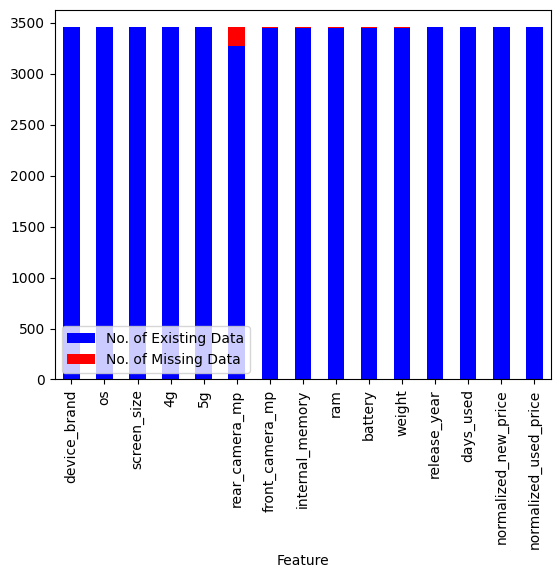

In [ ]:
missing_count.set_index('Feature').plot(kind='bar', stacked=True, color=['blue', 'red'])

In [ ]:
missing_count['Percentage of Missing Data'] = round((missing_count['No. of Missing Data'] / len(df_copy)) * 100, 2)
missing_count

,Feature,No. of Existing Data,No. of Missing Data,Percentage of Missing Data
0,device_brand,3454,0,0.00
0,os,3454,0,0.00
0,screen_size,3454,0,0.00
0,4g,3454,0,0.00
0,5g,3454,0,0.00
0,rear_camera_mp,3275,179,5.18
0,front_camera_mp,3452,2,0.06
0,internal_memory,3450,4,0.12
0,ram,3450,4,0.12
0,battery,3448,6,0.17


<h3>Duplicated Data</h3>

In [ ]:
print('Total No. of Duplicated entries in the dataset:', df_copy.duplicated().sum()) # Checks for total number of duplicated entries in the dataset

Total No. of Duplicated entries in the dataset: 0


<p>For additional analysis, a more clearer reading of the number of missing data for each feature can be seen. There are a total of 202 missing values in the dataset. Furthermore, the sum of duplicated data is obtain and thankfully, there is none in the dataset.

To deal with these existing issues, pre-processing must be done with care depending on further exploration.</p>

<h2>Data Visualization</h2>
<h3>Histograms, Bar graphs and Box plots to help better show the distribution of data and identify outliers</h3>

In [ ]:
numerical = df_copy.select_dtypes(include=['float64', 'int64']) # Selects all numerical features
categorical = df_copy.select_dtypes(include='object') # Selects all categorical features

<ipython-input-15-b5a764be5f08>:7: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[0].set_xticklabels(df_copy['device_brand'].unique(), rotation=90)


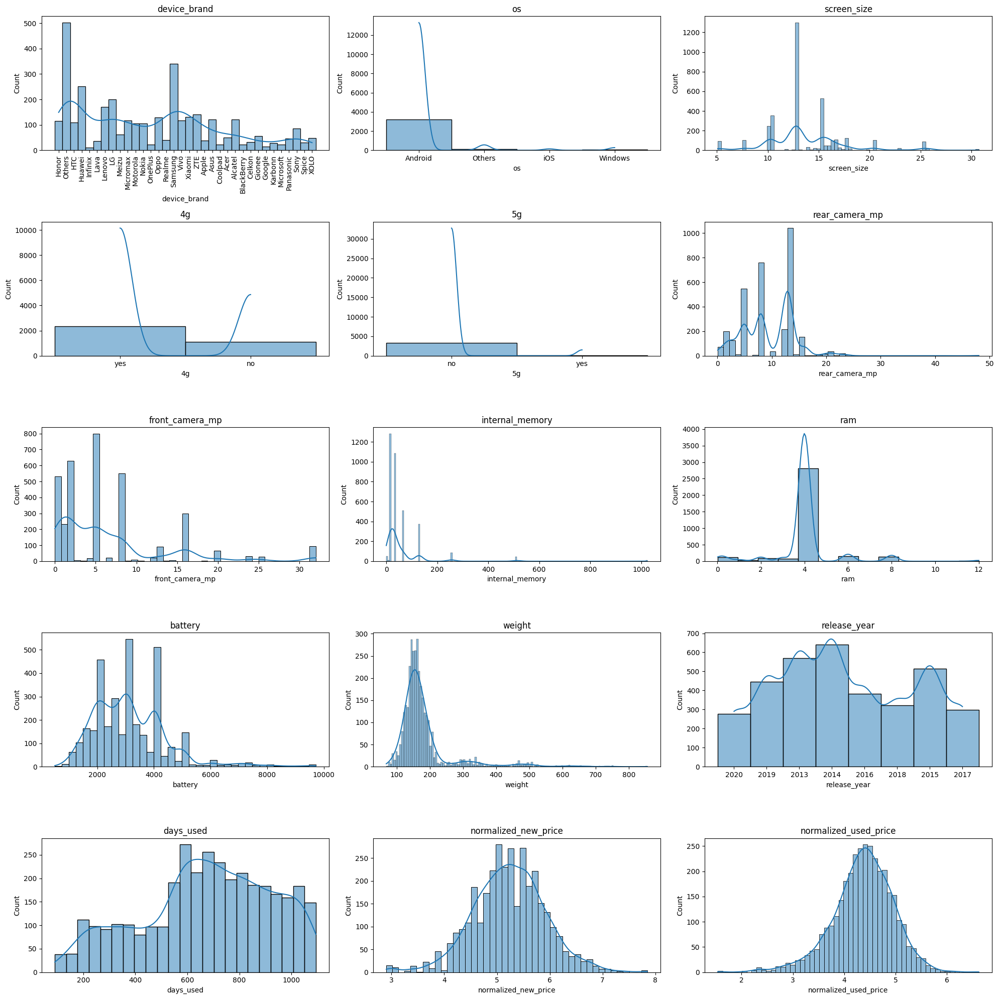

In [ ]:
fig, axs = plt.subplots(5, 3, figsize=(20, 20)) # Creates a figure that will house the multiple axes / subplots. 5 rows and 3 columns for the plot.

axs = axs.ravel() # Flattens the previously 2D array of axes position into a 1D array to simplify looping code

sns.histplot(df_copy['device_brand'], kde=True, ax = axs[0]) # Histogram visualization of the features
axs[0].set_title('device_brand') # Sets the title of the axes to the name of the feature
axs[0].set_xticklabels(df_copy['device_brand'].unique(), rotation=90)

for idx, name in enumerate(df_copy.drop(['device_brand'], axis=1).columns): # Loops through the features
  idy = idx + 1
  sns.histplot(df_copy[name], kde=True, ax = axs[idy]) # Histogram visualization of the features
  axs[idy].set_title(name) # Sets the title of the axes to the name of the feature

plt.tight_layout() # Makes sure that there is no overlapping between axes
plt.show() # Shows the figure / plot

<p>Histograms shows the frequencies of each categories in the categorical features and it also shows the frequency of continuous values in the numerical features. For certain features which includes "screen_size", "rear_camera_mp", "front_camera_mp", "internal_memory" and "ram", there is a sparcity between key values for each of the features. This makes sense as for devices, there are common values and trends for specifications of devices such as typical resolution of cameras and also screen sizes. This also causes an abnormal distribution of data, making them be skewed to a certain direction, which should also be seen in boxplots having many outliers.</p>

<p>Figures below provide a clearer image of some of the histograms</p>

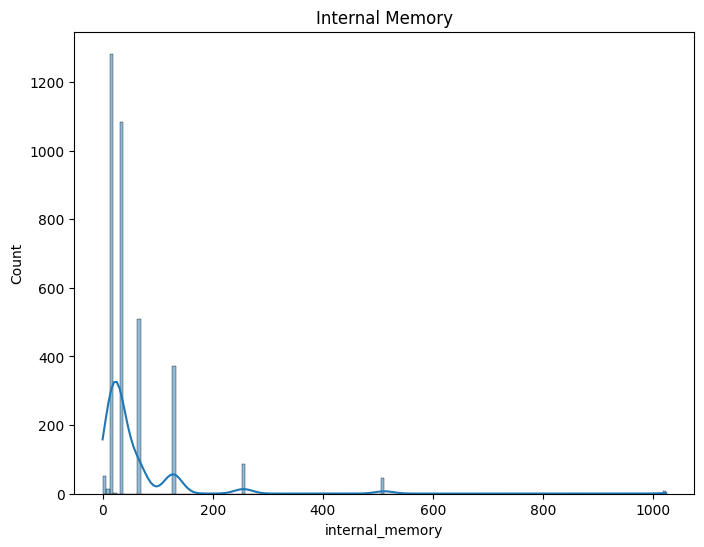

In [ ]:
plt.figure(figsize=(8, 6)) # Sets the next figure size to 8 by 6
sns.histplot(df_copy['internal_memory'], kde=True)
plt.title('Internal Memory') # Sets title of figure
plt.show() # Shows the figure / plot

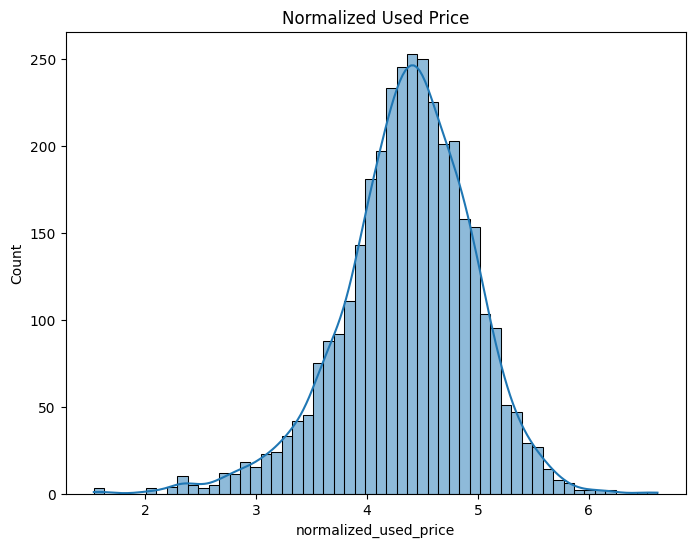

In [ ]:
plt.figure(figsize=(8, 6)) # Sets the next figure size to 8 by 6
sns.histplot(df_copy['normalized_used_price'], kde=True)
plt.title('Normalized Used Price') # Sets title of figure
plt.show() # Shows the figure / plot

<ipython-input-18-34b110915ec5>:2: FutureWarning: `sort_columns` is deprecated and will be removed in a future version.
  df_copy[name].value_counts().sort_index().plot.bar(sort_columns=True, figsize=(16, 5), title=name)


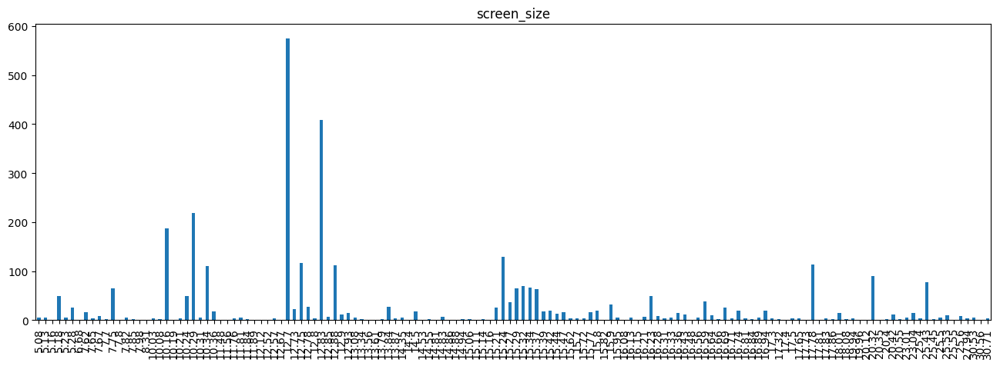

<ipython-input-18-34b110915ec5>:2: FutureWarning: `sort_columns` is deprecated and will be removed in a future version.
  df_copy[name].value_counts().sort_index().plot.bar(sort_columns=True, figsize=(16, 5), title=name)


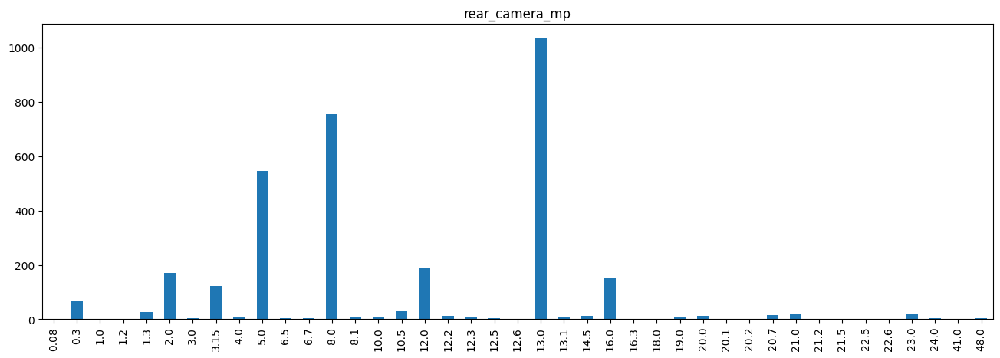

<ipython-input-18-34b110915ec5>:2: FutureWarning: `sort_columns` is deprecated and will be removed in a future version.
  df_copy[name].value_counts().sort_index().plot.bar(sort_columns=True, figsize=(16, 5), title=name)


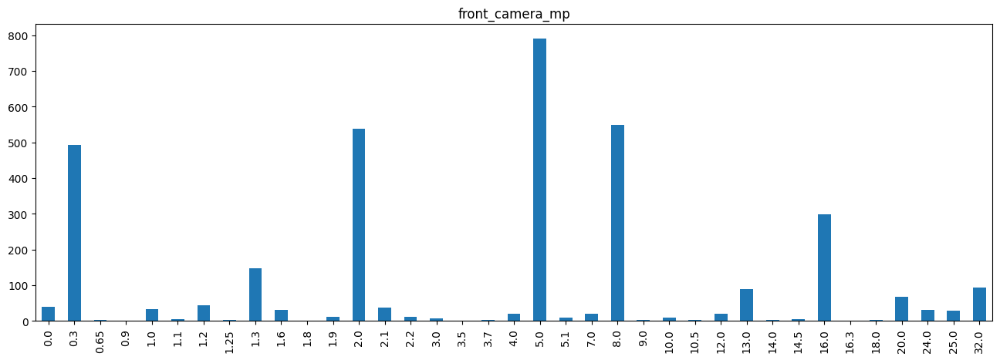

<ipython-input-18-34b110915ec5>:2: FutureWarning: `sort_columns` is deprecated and will be removed in a future version.
  df_copy[name].value_counts().sort_index().plot.bar(sort_columns=True, figsize=(16, 5), title=name)


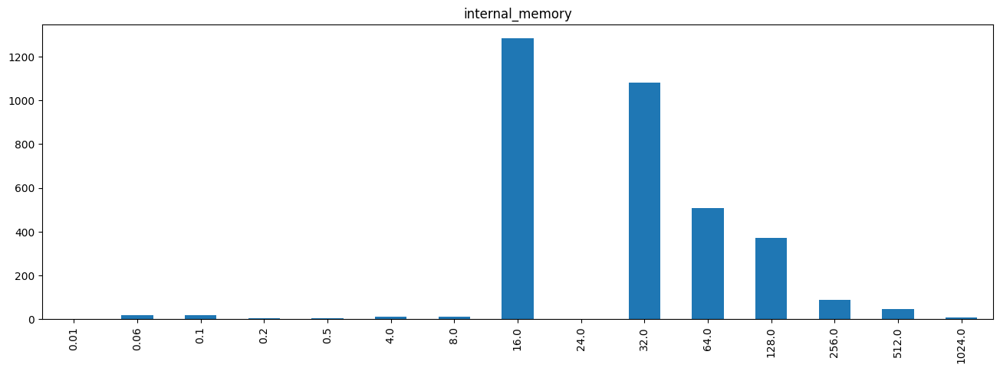

<ipython-input-18-34b110915ec5>:2: FutureWarning: `sort_columns` is deprecated and will be removed in a future version.
  df_copy[name].value_counts().sort_index().plot.bar(sort_columns=True, figsize=(16, 5), title=name)


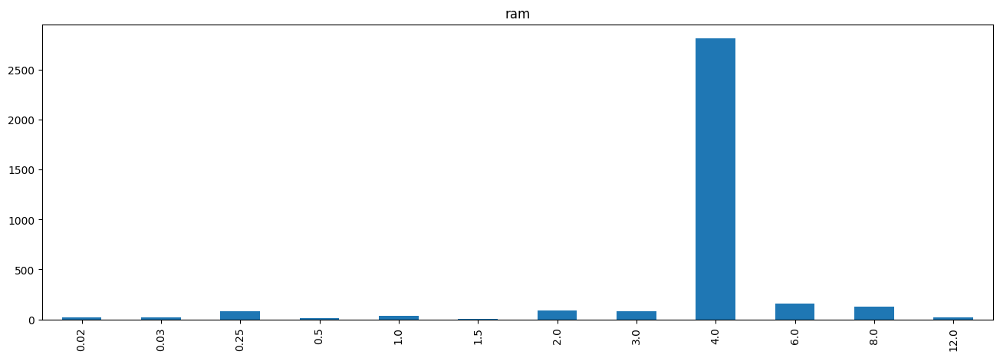

<ipython-input-18-34b110915ec5>:2: FutureWarning: `sort_columns` is deprecated and will be removed in a future version.
  df_copy[name].value_counts().sort_index().plot.bar(sort_columns=True, figsize=(16, 5), title=name)


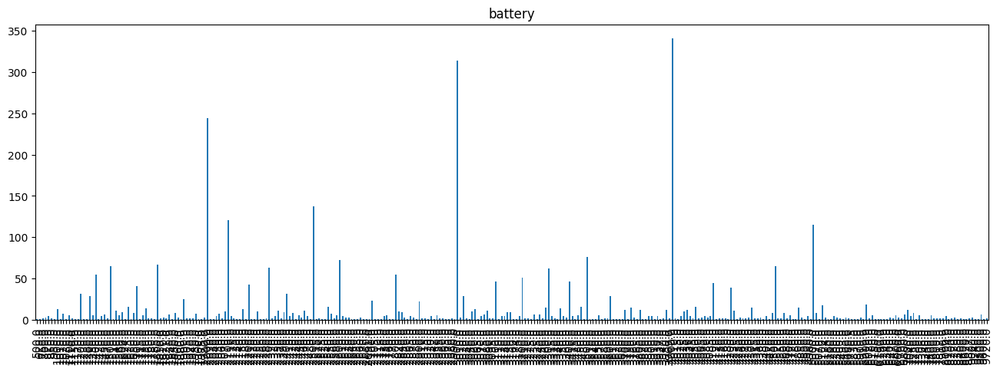

<ipython-input-18-34b110915ec5>:2: FutureWarning: `sort_columns` is deprecated and will be removed in a future version.
  df_copy[name].value_counts().sort_index().plot.bar(sort_columns=True, figsize=(16, 5), title=name)


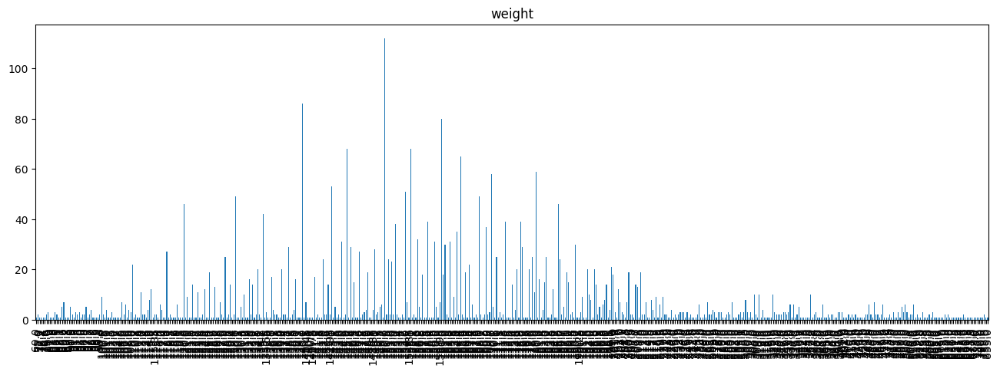

<ipython-input-18-34b110915ec5>:2: FutureWarning: `sort_columns` is deprecated and will be removed in a future version.
  df_copy[name].value_counts().sort_index().plot.bar(sort_columns=True, figsize=(16, 5), title=name)


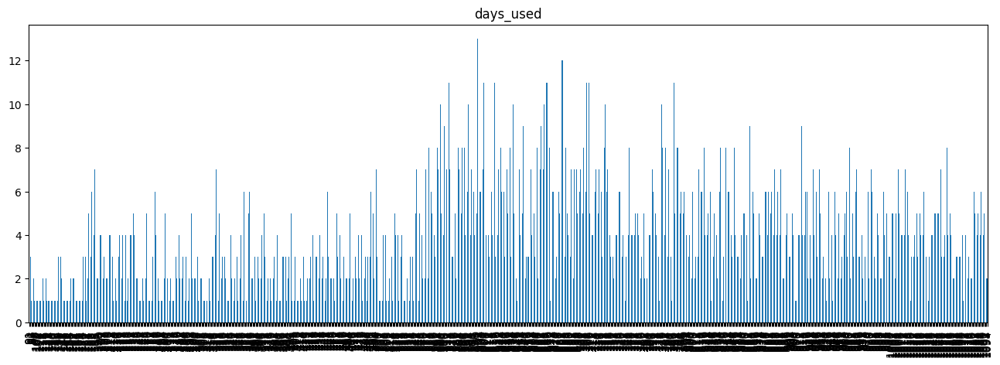

In [ ]:
for name in numerical.drop(['normalized_new_price', 'normalized_used_price'], axis=1).columns: # Loops through the numerical features
  df_copy[name].value_counts().sort_index().plot.bar(sort_columns=True, figsize=(16, 5), title=name)
  plt.show()

<p>Bar charts below are used to see the unique values in numerical features and also help to show the distribution in categorical features</p>
<p>rear_camera_mp, front_camera_mp, internal_memory and ram all have commonly used unique values thanks to industry standard.</p>

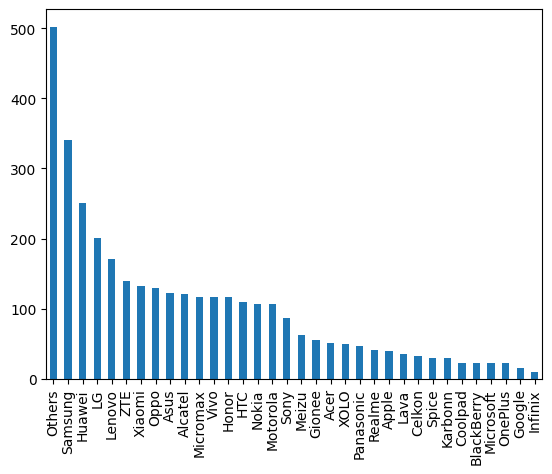

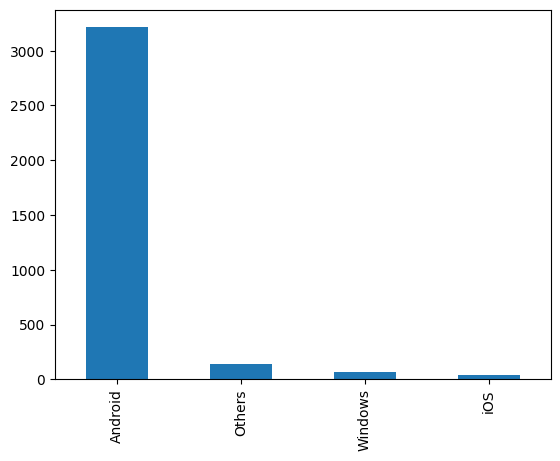

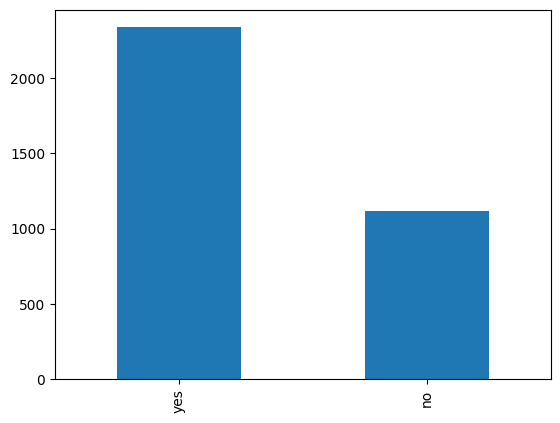

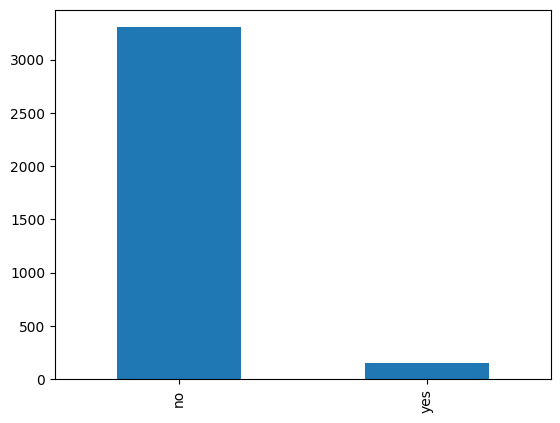

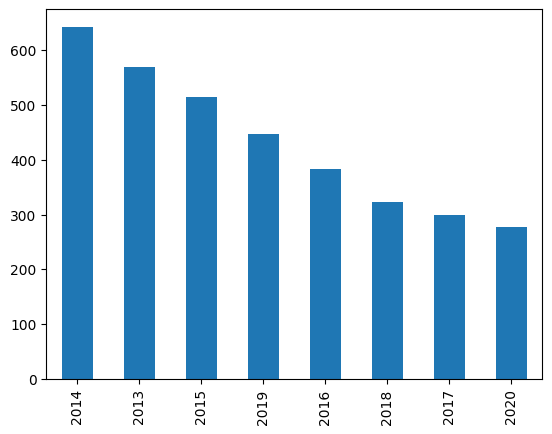

In [ ]:
for name in categorical.columns:
  df_copy[name].value_counts().plot.bar()
  plt.show()

<p>release_year has even distribution while the other categorical features are all uneven</p>

<p>Figures below provide a clearer image of some of the bar charts</p>

<ipython-input-20-66d11c60e86f>:1: FutureWarning: `sort_columns` is deprecated and will be removed in a future version.
  df_copy['internal_memory'].value_counts().sort_index().plot.bar(sort_columns=True, figsize=(8, 6), title='Internal Memory')


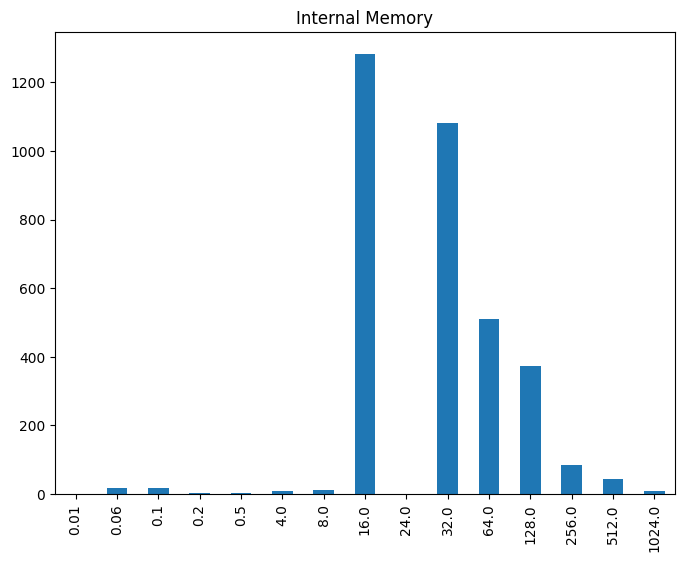

In [ ]:
df_copy['internal_memory'].value_counts().sort_index().plot.bar(sort_columns=True, figsize=(8, 6), title='Internal Memory')
plt.show()

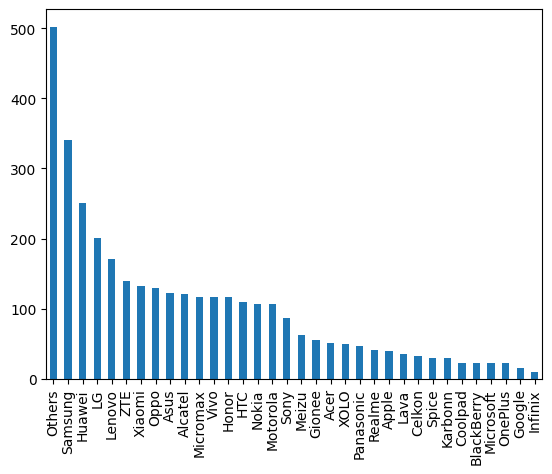

In [ ]:
df_copy['device_brand'].value_counts().plot.bar()
plt.show()

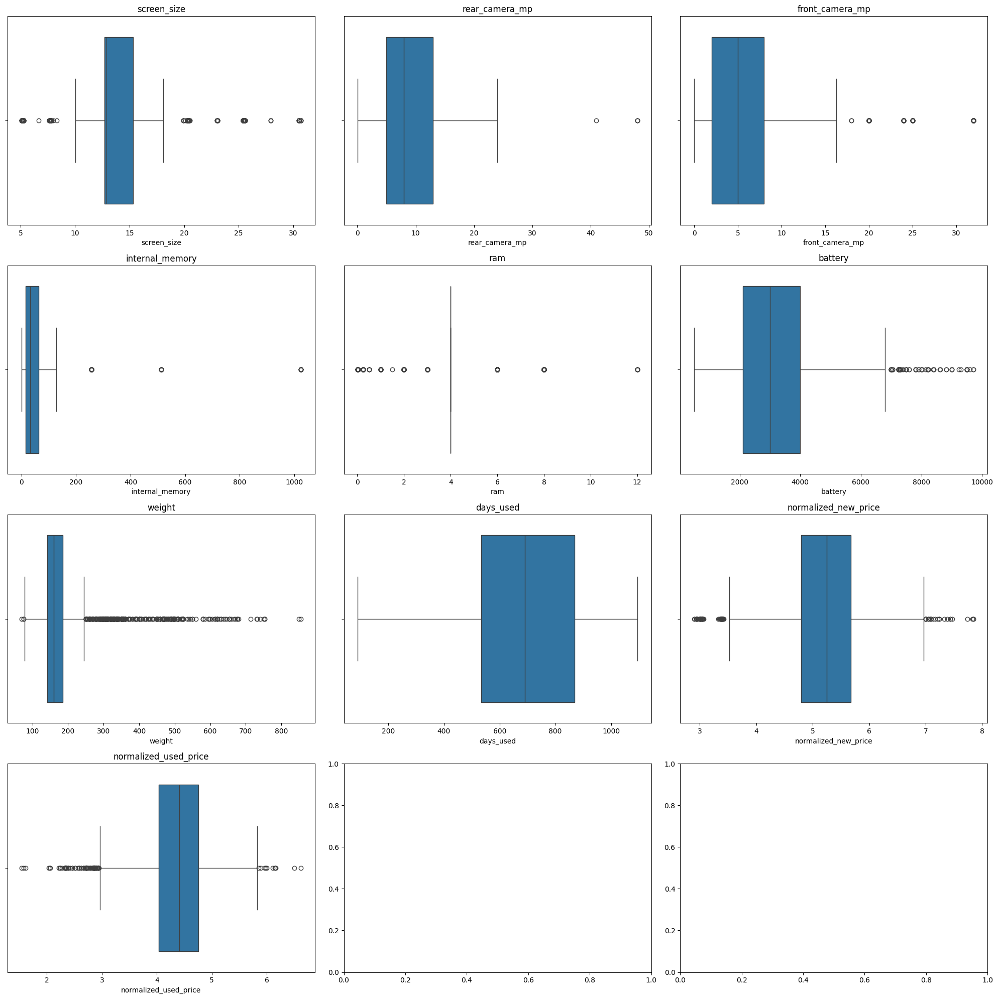

In [ ]:
fig, axs = plt.subplots(4, 3, figsize=(20, 20)) # Creates a figure that will house the multiple axes / subplots. 4 rows and 3 columns for the plot.

axs = axs.ravel() # Flattens the previously 2D array of axes position into a 1D array to simplify looping code
for idx, name in enumerate(numerical.columns): # Loops through the numerical features
  sns.boxplot(numerical[name], orient='h', ax = axs[idx]) # Boxplot visualization of the numerical features, used to look for potential outliers
  axs[idx].set_title(name) # Sets the title of the axes to the name of the feature

plt.tight_layout() # Makes sure that there is no overlapping between axes
plt.show() # Shows the figure / plot

<p>Boxplots also show the distribution of the data, along with showing potential outliers. It is only for numerical features, and it seems that there are a lot of outliers due to unusual distribution of features. This makes the outliers be expected and should not be simply removed.</p>

<p>Figures below provide a clearer image of some of the box plots</p>

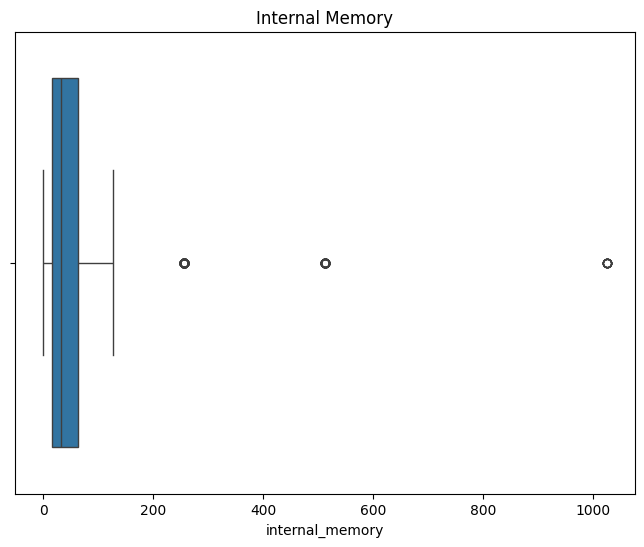

In [ ]:
plt.figure(figsize=(8, 6)) # Sets the next figure size to 8 by 6
sns.boxplot(df_copy['internal_memory'], orient='h')
plt.title('Internal Memory') # Sets title of figure
plt.show() # Shows the figure / plot

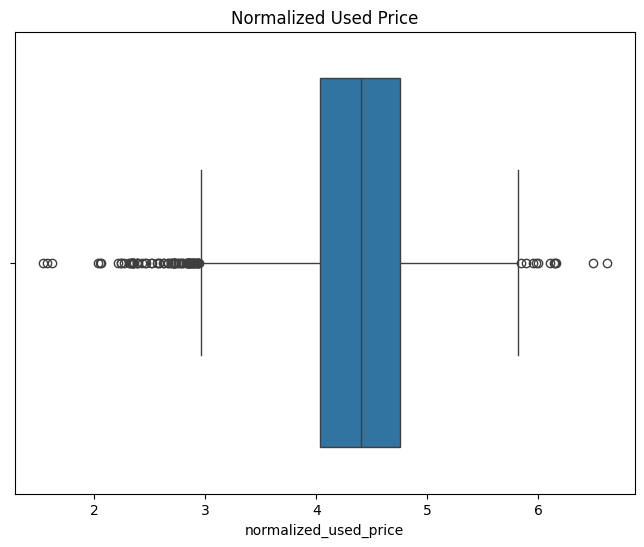

In [ ]:
plt.figure(figsize=(8, 6)) # Sets the next figure size to 8 by 6
sns.boxplot(df_copy['normalized_used_price'], orient='h')
plt.title('Normalized Used Price') # Sets title of figure
plt.show() # Shows the figure / plot

# Descriptive Exploratory Data Analysis (EDA)
<p>To analyze the data within the dataset and gain insights to the relationships between features of the data.</p>

<h2>Statistical Analysis</h2>
<h3>Basic statistical analysis of the features</h3>

In [ ]:
numerical.describe() # Shows basic statistical infomation on numerical features

,screen_size,rear_camera_mp,front_camera_mp,internal_memory,ram,battery,weight,days_used,normalized_new_price,normalized_used_price
count,3454.000000,3275.000000,3452.000000,3450.000000,3450.000000,3448.000000,3447.000000,3454.000000,3454.000000,3454.000000
mean,13.713115,9.460208,6.554229,54.573099,4.036122,3133.402697,182.751871,674.869716,5.233107,4.364712
std,3.805280,4.815461,6.970372,84.972371,1.365105,1299.682844,88.413228,248.580166,0.683637,0.588914
min,5.080000,0.080000,0.000000,0.010000,0.020000,500.000000,69.000000,91.000000,2.901422,1.536867
25%,12.700000,5.000000,2.000000,16.000000,4.000000,2100.000000,142.000000,533.500000,4.790342,4.033931
50%,12.830000,8.000000,5.000000,32.000000,4.000000,3000.000000,160.000000,690.500000,5.245892,4.405133
75%,15.340000,13.000000,8.000000,64.000000,4.000000,4000.000000,185.000000,868.750000,5.673718,4.755700
max,30.710000,48.000000,32.000000,1024.000000,12.000000,9720.000000,855.000000,1094.000000,7.847841,6.619433


In [ ]:
categorical.describe() # Shows basic statistical infomation on categorical features

,device_brand,os,4g,5g,release_year
count,3454,3454,3454,3454,3454
unique,34,4,2,2,8
top,Others,Android,yes,no,2014
freq,502,3214,2335,3302,642


In [ ]:
for feature in categorical.columns: # Shows an easier to read distribution of the categorical features
  print(categorical[feature].value_counts())
  print("")

Others        502
Samsung       341
Huawei        251
LG            201
Lenovo        171
ZTE           140
Xiaomi        132
Oppo          129
Asus          122
Alcatel       121
Micromax      117
Vivo          117
Honor         116
HTC           110
Nokia         106
Motorola      106
Sony           86
Meizu          62
Gionee         56
Acer           51
XOLO           49
Panasonic      47
Realme         41
Apple          39
Lava           36
Celkon         33
Spice          30
Karbonn        29
Coolpad        22
BlackBerry     22
Microsoft      22
OnePlus        22
Google         15
Infinix        10
Name: device_brand, dtype: int64

Android    3214
Others      137
Windows      67
iOS          36
Name: os, dtype: int64

yes    2335
no     1119
Name: 4g, dtype: int64

no     3302
yes     152
Name: 5g, dtype: int64

2014    642
2013    570
2015    515
2019    446
2016    383
2018    322
2017    299
2020    277
Name: release_year, dtype: int64



In [ ]:
for feature in categorical.columns: # Shows an easier to read distribution of the categorical features
  print(categorical[feature].value_counts(normalize=True) * 100)
  print("")

Others        14.533874
Samsung        9.872611
Huawei         7.266937
LG             5.819340
Lenovo         4.950782
ZTE            4.053272
Xiaomi         3.821656
Oppo           3.734800
Asus           3.532137
Alcatel        3.503185
Micromax       3.387377
Vivo           3.387377
Honor          3.358425
HTC            3.184713
Nokia          3.068906
Motorola       3.068906
Sony           2.489867
Meizu          1.795020
Gionee         1.621309
Acer           1.476549
XOLO           1.418645
Panasonic      1.360741
Realme         1.187030
Apple          1.129126
Lava           1.042270
Celkon         0.955414
Spice          0.868558
Karbonn        0.839606
Coolpad        0.636943
BlackBerry     0.636943
Microsoft      0.636943
OnePlus        0.636943
Google         0.434279
Infinix        0.289519
Name: device_brand, dtype: float64

Android    93.051534
Others      3.966416
Windows     1.939780
iOS         1.042270
Name: os, dtype: float64

yes    67.602779
no     32.397221
Name

<p>Key features for numerical features are that the values in the "normalized_new_price" and "normalized_used_price" features are much smaller than the others while values in "internal_memory", "battery", "weight", "release_year" and "days_used" have relatively much larger ranges. This may indicate that feature scaling can improve future model performances.

For categorical features the "os" feature has 4 categories, "release_year" has 8 categories, while "4g" and "5g" has 2 categories. Unlike the others, the "device_brand" feature has much more categories making the data in that feature more distributed which can be seen from the frequency of the most frequent / top class be much lower than the other categorical features. One key observation to note is how the top class in the "os" and "5g" feature has frequencies very close to the number of rows in the dataset. This would mean that there are very uneven distributions for those features as entries that do not have the top value are far and few between.</p>

<h2>Correlation Analysis</h2>
<h3>A bivariate analysis is to be performed to learn of the hidden relationships between the features.</h3>

In [ ]:
correlation = numerical.corr() # Creates a correlation matrix on the numerical features and stores it in "correlation"
correlation

,screen_size,rear_camera_mp,front_camera_mp,internal_memory,ram,battery,weight,days_used,normalized_new_price,normalized_used_price
screen_size,1.000000,0.150316,0.271640,0.071291,0.274449,0.813533,0.828890,-0.291723,0.460889,0.614785
rear_camera_mp,0.150316,1.000000,0.429264,0.018766,0.260802,0.248563,-0.087738,-0.144672,0.541655,0.587302
front_camera_mp,0.271640,0.429264,1.000000,0.296426,0.477411,0.369709,-0.004997,-0.552636,0.475479,0.608074
internal_memory,0.071291,0.018766,0.296426,1.000000,0.122496,0.117736,0.014948,-0.242712,0.195992,0.190993
ram,0.274449,0.260802,0.477411,0.122496,1.000000,0.280740,0.089916,-0.280066,0.532056,0.520289
battery,0.813533,0.248563,0.369709,0.117736,0.280740,1.000000,0.703388,-0.370895,0.470754,0.613619
weight,0.828890,-0.087738,-0.004997,0.014948,0.089916,0.703388,1.000000,-0.067470,0.269540,0.382354
days_used,-0.291723,-0.144672,-0.552636,-0.242712,-0.280066,-0.370895,-0.067470,1.000000,-0.216625,-0.358264
normalized_new_price,0.460889,0.541655,0.475479,0.195992,0.532056,0.470754,0.269540,-0.216625,1.000000,0.834496
normalized_used_price,0.614785,0.587302,0.608074,0.190993,0.520289,0.613619,0.382354,-0.358264,0.834496,1.000000


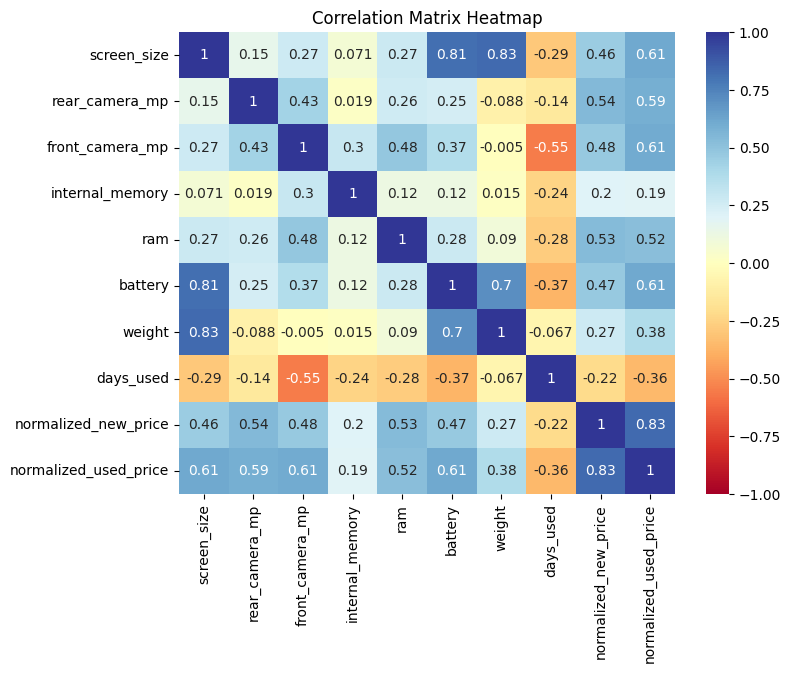

In [ ]:
plt.figure(figsize=(8, 6)) # Sets the next figure size to 8 by 6
sns.heatmap(correlation, annot=True, cmap='RdYlBu', vmin=-1, vmax=1) # Creates a heatmap using data from "correlation".
plt.title('Correlation Matrix Heatmap') # Sets title of figure
plt.show() # Shows the figure / plot

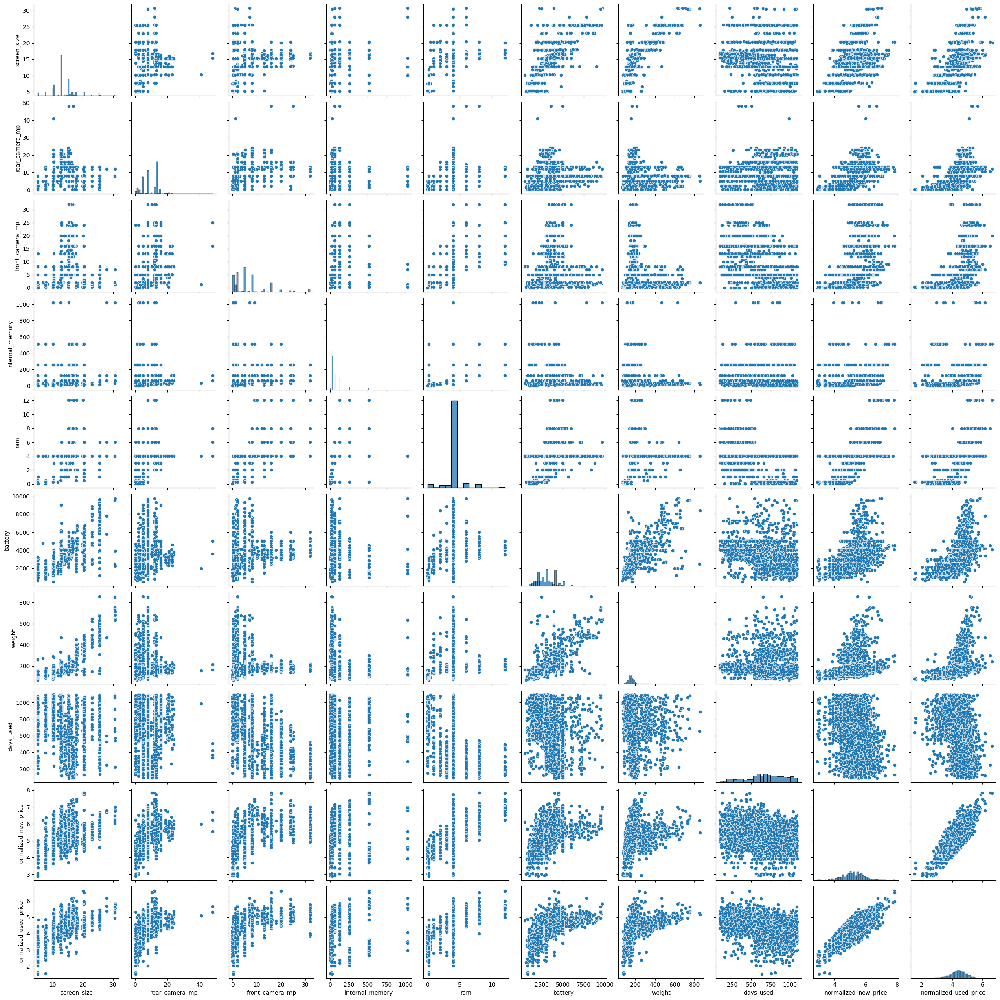

In [ ]:
sns.pairplot(df_copy) # Creates a pairplot between the numerical features which helps to visualize the correlation

<p>The correlation between numerical features show that there are good positive correlations between "battery" and "screen_size", "weight" and "screen_size" and, "normalized_new_price" and the target feature "normalized_used_price". Specifically for the target feature, all other relationships are have a moderate positive correlation other than "internal_memory" and "weight" which have a low positive correlation while "days_used" has a low negative correlation. From this it can be expected that as "normalized_new_price" increases, the target variable will also rise but not as much. Similar to the other features, as they increase, so will "normalized_used_price" but at a lesser degree while as "days_used" increases, the target feature will decrease.

From the intersect between the same feature, a histogram distribution can also be seen to help show how the data is distributed visually.</p>

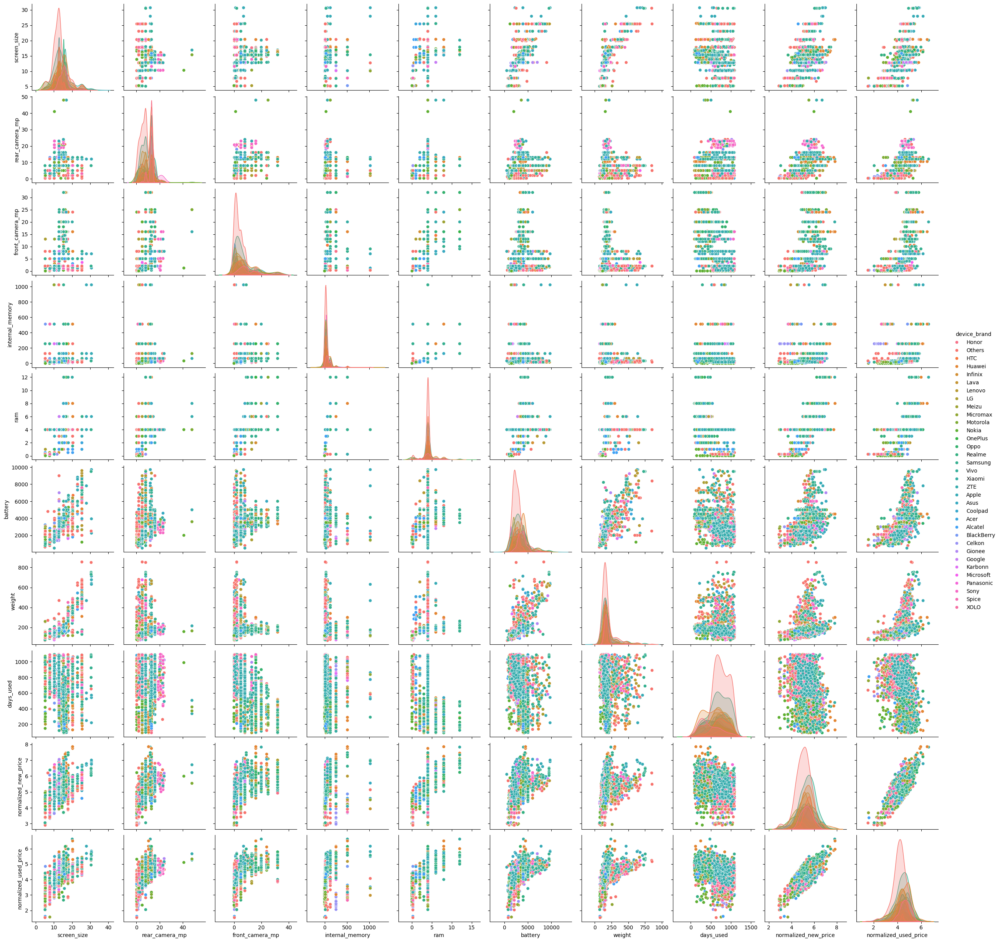

In [ ]:
sns.pairplot(df_copy, hue='device_brand') # Creates a pairplot between the numerical features while setting the points to corresponding "device_brand" value
                                     # This is done to visually show the correlation between the categorical feature with the numerical features

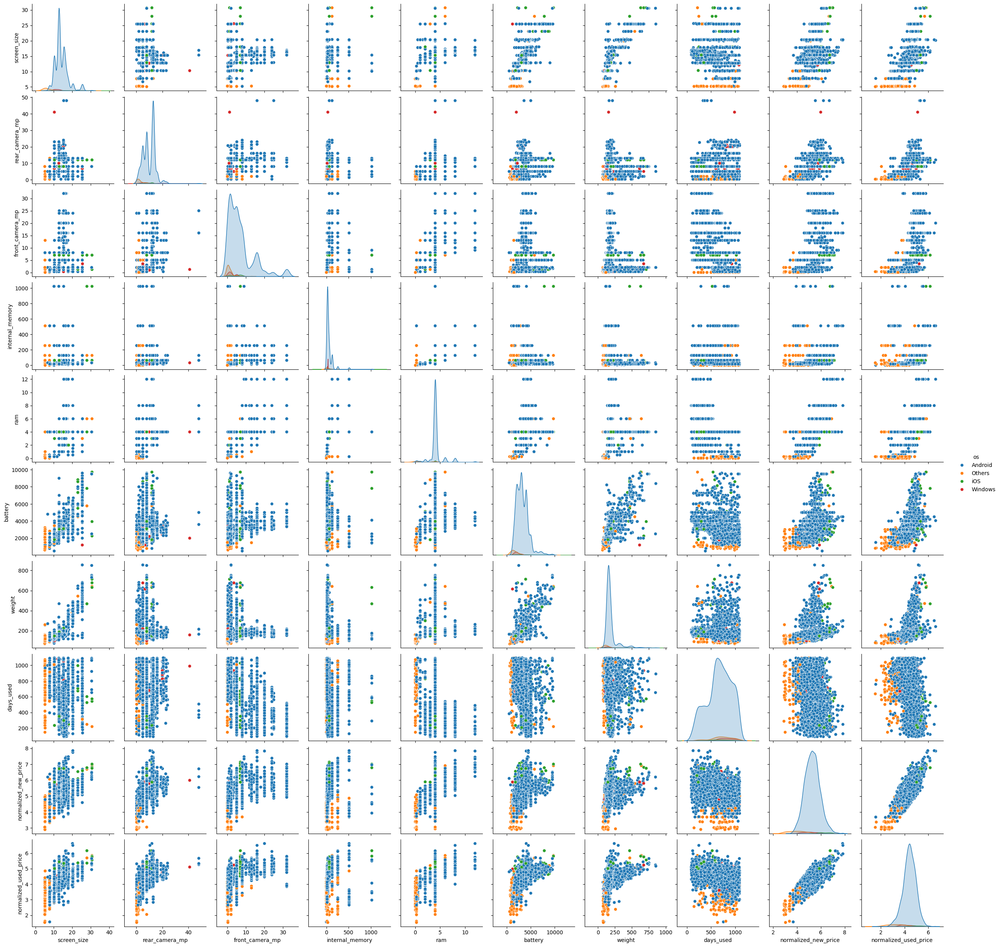

In [ ]:
sns.pairplot(df_copy, hue='os') # Creates a pairplot between the numerical features while setting the points to corresponding "os" value

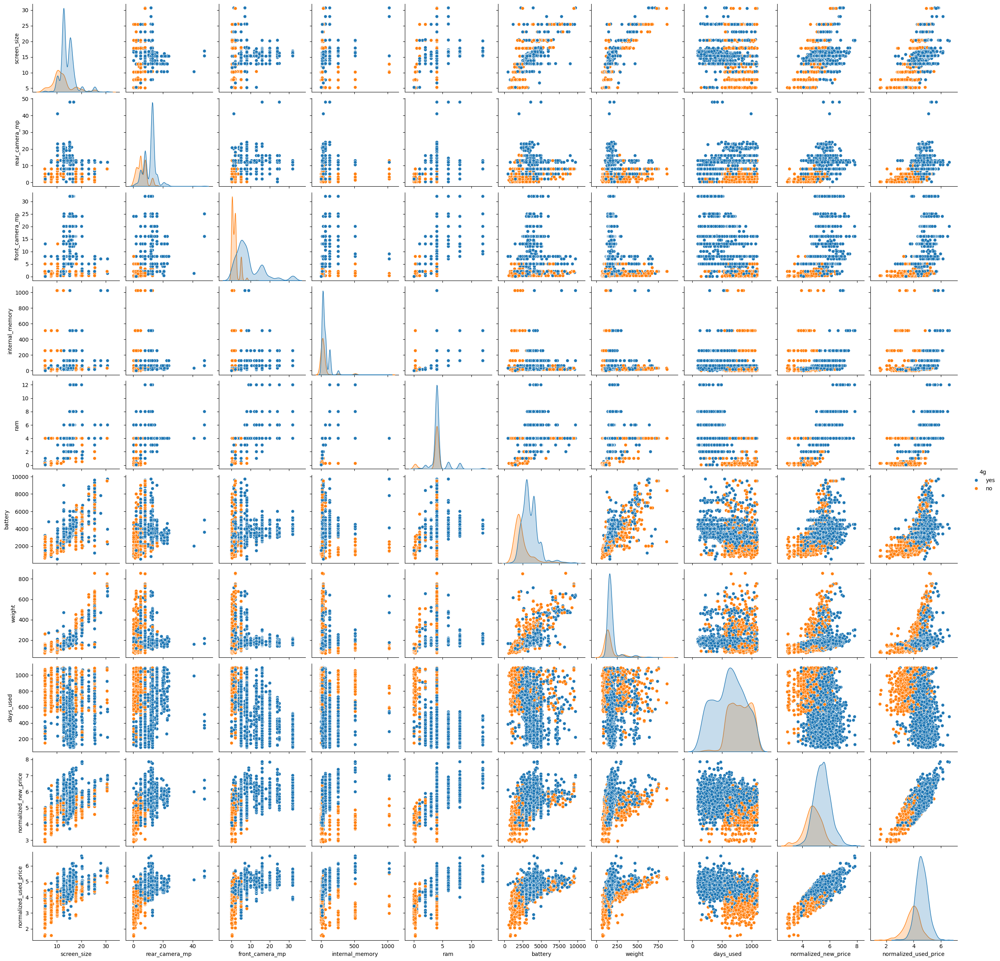

In [ ]:
sns.pairplot(df_copy, hue='4g') # Creates a pairplot between the numerical features while setting the points to corresponding "4g" value

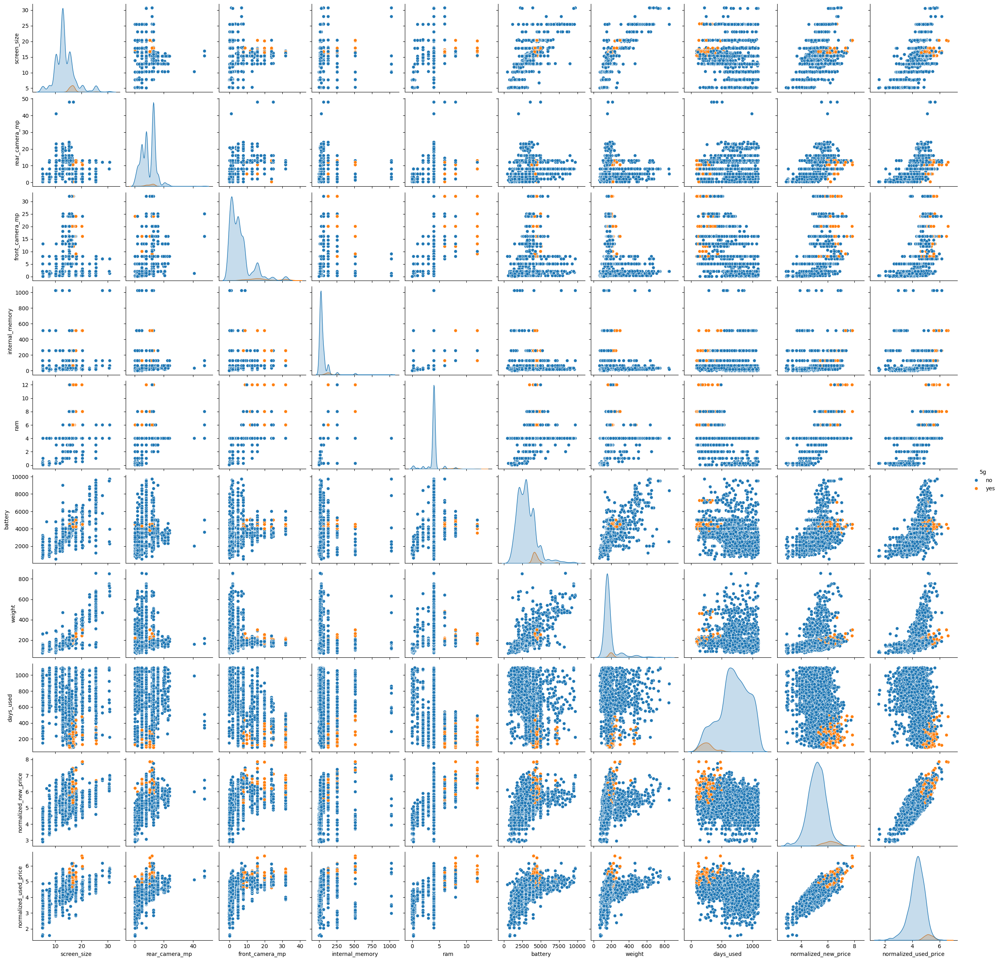

In [ ]:
sns.pairplot(df_copy, hue='5g') # Creates a pairplot between the numerical features while setting the points to corresponding "5g" value

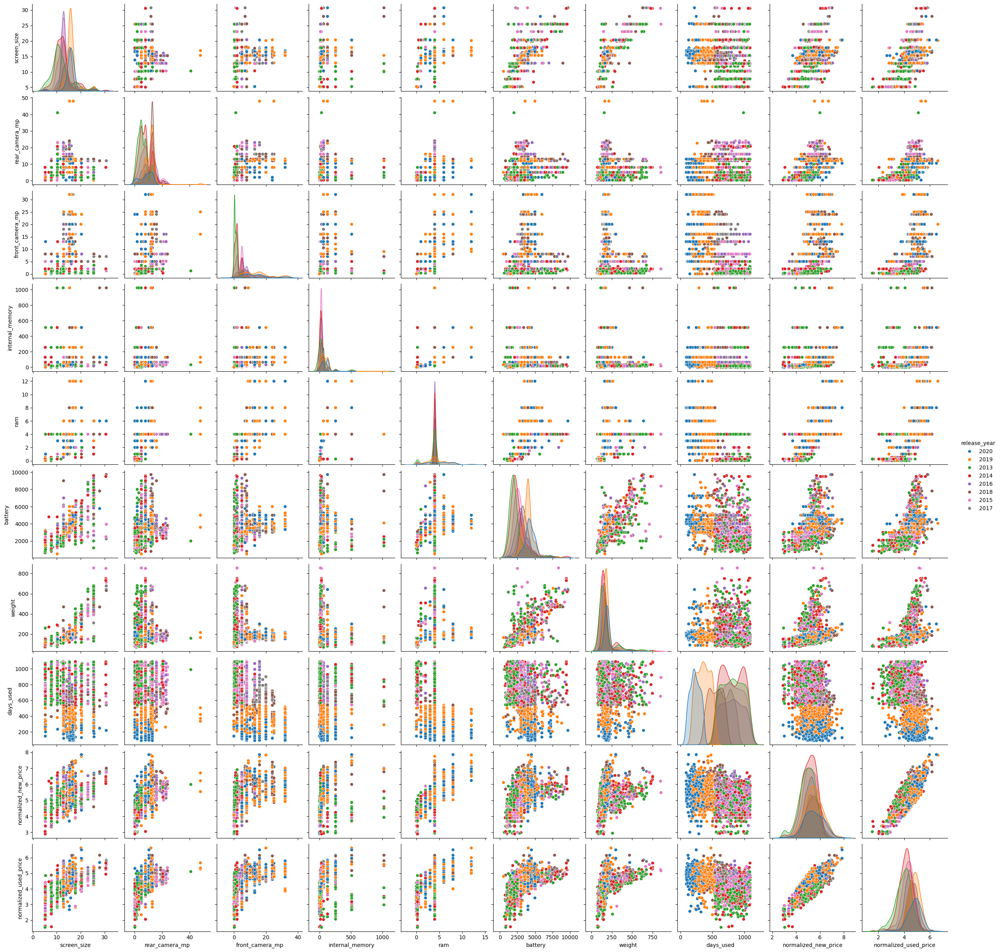

In [ ]:
sns.pairplot(df_copy, hue='release_year') # Creates a pairplot between the numerical features while setting the points to corresponding "release_year" value

<p>For the relationship between the categorical and specifically the target feature, when a device has 4g capabilities it will typically be priced higher. Additionally, a device having 5g capabilities will also normally be higher priced. Even though there is a much lower number of devices that can use 5g, this pattern is clearly evident.

For "release_year" it is not the most clear, however a pattern that can be seen is that devices that are newer can be resold at a higher price.

For "os" due to the much larger number of devices using Android, it is difficult to make out a clear correlation, but it can be seen that devices that with Other as their os normally have lower prices, while the other classes are priced higher. With IOS being sold most commonly at the highest price, while for Android devices it has a larger price range.

On the other hand, for the "device_brand", with the many classes in the feature, a correlation cannot be easily seen visually.</p>

<h2>EDA Summary</h2>
<p>From the output from info(), there are a total of 3454 rows in the dataset with numerous missing data hidden within. These missing values are in features "rear_camera_mp", "front_camera_mp", "internal_memory", "ram", "battery" and "weight".

Additionally, there are a total of 15 features in the dataset with "normalized_used_price" being the target feature. There are 5 features being categorical, while the other features are numeric.

There are a total of 202 missing values in the dataset, and there are no duplicated data. To deal with these existing issues, pre-processing must be done with care depending on further exploration.

Seen from the histograms, for certain features which includes "screen_size", "rear_camera_mp", "front_camera_mp", "internal_memory" and "ram", there is a sparcity between key values for each of the features. This makes sense as for devices, there are common values and trends for specifications of devices such as typical resolution of cameras and also screen sizes. This also causes an abnormal distribution of data, making them be skewed to a certain direction, which should also be seen in boxplots having many outliers.

In boxplots there seems to be a lot of outliers due to unusual distribution of features. This makes the outliers be expected and should not be simply removed.

Key features for numerical features are that the values in the "normalized_new_price" and "normalized_used_price" features are much smaller than the others while values in "internal_memory", "battery", "weight" and "days_used" have relatively much larger ranges. This may indicate that feature scaling can improve future model performances.

For categorical features the "os" feature has 4 categories, "release_year" has 8 categories, while "4g" and "5g" has 2 categories. Unlike the others, the "device_brand" feature has much more categories making the data in that feature more distributed which can be seen from the frequency of the most frequent / top class be much lower than the other categorical features. One key observation to note is how the top class in the "os" and "5g" feature has frequencies very close to the number of rows in the dataset. This would mean that there are very uneven distributions for those features as entries that do not have the top value are far and few between.

The correlation between numerical features show that there are good positive correlations between "battery" and "screen_size", "weight" and "screen_size" and, "normalized_new_price" and the target feature "normalized_used_price". Specifically for the target feature, all other relationships are have a moderate positive correlation other than "internal_memory" and "weight" which have a low positive correlation while "days_used" has a low negative correlation. From this it can be expected that as "normalized_new_price" increases, the target variable will also rise but not as much. Similar to the other features, as they increase, so will "normalized_used_price" but at a lesser degree while as "days_used" increases, the target feature will decrease.

For the relationship between the categorical and specifically the target feature, when a device has 4g capabilities it will typically be priced higher. Additionally, a device having 5g capabilities will also normally be higher priced. Even though there is a much lower number of devices that can use 5g, this pattern is clearly evident. For "release_year" it is not the most clear, however a pattern that can be seen is that devices that are newer can be resold at a higher price.

For "os" due to the much larger number of devices using Android, it is difficult to make out a clear correlation, but it can be seen that devices that with Other as their os normally have lower prices, while the other classes are priced higher. With IOS being sold most commonly at the highest price, while for Android devices it has a larger price range. On the other hand, for the "device_brand", with the many classes in the feature, a correlation cannot be easily seen visually.
</p>


# Data Preparation and Modelling

<h3>Importing Libraries</h3>

In [ ]:
# Libraries and Functions Need
# Train Test Split
from sklearn.model_selection import train_test_split

# Data Treatment
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

# Models
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR

# Evaluation and Optimization
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV

In [ ]:
rs = 123 # Value for keeping the same Random State

# Dataset A
<p>Pre-processing: Replacement of Missing Data

Data Treatment: Standard Scaling and Label Encoding</p>

In [ ]:
df_a = df_copy.copy() # Makes a copy of the original dataset

<h3>Pre-processing</h3>

In [ ]:
df_a.isnull().sum() # Checks for total number of missing data for each feature

device_brand               0
os                         0
screen_size                0
4g                         0
5g                         0
rear_camera_mp           179
front_camera_mp            2
internal_memory            4
ram                        4
battery                    6
weight                     7
release_year               0
days_used                  0
normalized_new_price       0
normalized_used_price      0
dtype: int64

Features 'rear_camera_mp', 'front_camera_mp', 'internal_memory', 'ram', 'battery' and 'weight' have missing values.<br>
Therefore these features must be treated. However as there are a lot of outliers in the dataset, using mean is not the best option as it is very susceptible to them, hence the median will be used to replace missing data.

In [ ]:
df_a['rear_camera_mp'] = df_a['rear_camera_mp'].fillna(df_a['rear_camera_mp'].median())
df_a['front_camera_mp'] = df_a['front_camera_mp'].fillna(df_a['front_camera_mp'].median())
df_a['internal_memory'] = df_a['internal_memory'].fillna(df_a['internal_memory'].median())
df_a['ram'] = df_a['ram'].fillna(df_a['ram'].median())
df_a['battery'] = df_a['battery'].fillna(df_a['battery'].median())
df_a['weight'] = df_a['weight'].fillna(df_a['weight'].median())

print('Total No. of Missing Data:', df_a.isnull().sum().sum()) # Shows the total number of missing data
df_a.shape

Total No. of Missing Data: 0


(3454, 15)

<h3>Data Treatment</h3>

In [ ]:
# Label Encoding
label_encoder = LabelEncoder()
for name in categorical.columns:
  df_a[name] = label_encoder.fit_transform(df_a[name])

df_a.head()

,device_brand,os,screen_size,4g,5g,rear_camera_mp,front_camera_mp,internal_memory,ram,battery,weight,release_year,days_used,normalized_new_price,normalized_used_price
0,10,0,14.50,1,0,13.0,5.0,64.0,3.0,3020.0,146.0,7,127,4.715100,4.307572
1,10,0,17.30,1,1,13.0,16.0,128.0,8.0,4300.0,213.0,7,325,5.519018,5.162097
2,10,0,16.69,1,1,13.0,8.0,128.0,8.0,4200.0,213.0,7,162,5.884631,5.111084
3,10,0,25.50,1,1,13.0,8.0,64.0,6.0,7250.0,480.0,7,345,5.630961,5.135387
4,10,0,15.32,1,0,13.0,8.0,64.0,3.0,5000.0,185.0,7,293,4.947837,4.389995


Using Label Encoding changed all values of the previously categorical features into discrete numerical values.

In [ ]:
# Standard Scaling
X = df_a.drop('normalized_used_price', axis=1)
X_columns = X.columns
y = df_a['normalized_used_price'] # Normalized_used_price is the target feature

std_scale = StandardScaler()
X = std_scale.fit_transform(X)

df_a = pd.DataFrame(std_scale.fit_transform(X), index=df_a.index, columns=X_columns)
df_a['normalized_used_price'] = y

In [ ]:
df_a.head()

,device_brand,os,screen_size,4g,5g,rear_camera_mp,front_camera_mp,internal_memory,ram,battery,weight,release_year,days_used,normalized_new_price,normalized_used_price
0,-0.958061,-0.245963,0.206818,0.692264,-0.214552,0.769335,-0.222941,0.111324,-0.759524,-0.087163,-0.415615,1.755669,-2.204315,-0.757832,4.307572
1,-0.958061,-0.245963,0.942744,0.692264,4.660867,0.769335,1.355830,0.865025,2.905851,0.898683,0.343018,1.755669,-1.407676,0.418281,5.162097
2,-0.958061,-0.245963,0.782417,0.692264,4.660867,0.769335,0.207633,0.865025,2.905851,0.821663,0.343018,1.755669,-2.063495,0.953164,5.111084
3,-0.958061,-0.245963,3.097957,0.692264,4.660867,0.769335,0.207633,0.111324,1.439701,3.170750,3.366229,1.755669,-1.327208,0.582051,5.135387
4,-0.958061,-0.245963,0.422339,0.692264,-0.214552,0.769335,0.207633,0.111324,-0.759524,1.437817,0.025977,1.755669,-1.536426,-0.417343,4.389995


# Dataset B
<p>Pre-processing: Removal of Missing Data

Data Treatment: Standard Scaling and Label Encoding</p>

In [ ]:
df_b = df_copy.copy() # Makes a copy of the original dataset

<h3>Pre-processing</h3>

In [ ]:
df_b = df_b.dropna() # Removes all entries with missing data

print('Total No. of Missing Data:', df_b.isnull().sum().sum()) # Shows the total number of missing data
df_b.shape # There are now only 3253 entries in the new dataset

Total No. of Missing Data: 0


(3253, 15)

<h3>Data Treatment</h3>

In [ ]:
# Label Encoding
label_encoder = LabelEncoder()
for name in categorical.columns:
  df_b[name] = label_encoder.fit_transform(df_b[name])

# Standard Scaling
X = df_b.drop('normalized_used_price', axis=1)
X_columns = X.columns
y = df_b['normalized_used_price'] # Normalized_used_price is the target feature

std_scale = StandardScaler()
X = std_scale.fit_transform(X)

df_b = pd.DataFrame(std_scale.fit_transform(X), index=df_b.index, columns=X_columns)
df_b['normalized_used_price'] = y

In [ ]:
df_b.head()

,device_brand,os,screen_size,4g,5g,rear_camera_mp,front_camera_mp,internal_memory,ram,battery,weight,release_year,days_used,normalized_new_price,normalized_used_price
0,-0.884168,-0.247763,0.229172,0.717239,-0.163801,0.733869,-0.165762,0.139313,-0.785637,-0.042357,-0.403932,1.935478,-2.415685,-0.748083,4.307572
1,-0.884168,-0.247763,0.956269,0.717239,6.104964,0.733869,1.501267,0.888472,3.293643,0.944720,0.337662,1.935478,-1.574627,0.448837,5.162097
2,-0.884168,-0.247763,0.797866,0.717239,6.104964,0.733869,0.288882,0.888472,3.293643,0.867604,0.337662,1.935478,-2.267013,0.993183,5.111084
3,-0.884168,-0.247763,3.085626,0.717239,6.104964,0.733869,0.288882,0.139313,1.661931,3.219623,3.292970,1.935478,-1.489672,0.615505,5.135387
4,-0.884168,-0.247763,0.442107,0.717239,-0.163801,0.733869,0.288882,0.139313,-0.785637,1.484527,0.027742,1.935478,-1.710555,-0.401570,4.389995


# Dataset C
<p>Pre-processing: Removal of Missing Data

Data Treatment: Normalization and Label Encoding</p>

In [ ]:
df_c = df_copy.copy() # Makes a copy of the original dataset

<h3>Pre-processing</h3>

In [ ]:
df_c = df_c.dropna() # Removes all entries with missing data

<h3>Data Treatment</h3>

In [ ]:
# Label Encoding
label_encoder = LabelEncoder()
for name in categorical.columns:
  df_c[name] = label_encoder.fit_transform(df_c[name])

# Normalization
X = df_c.drop('normalized_used_price', axis=1)
X_columns = X.columns
y = df_c['normalized_used_price'] # Normalized_used_price is the target feature

norm_scale = MinMaxScaler()
X = norm_scale.fit_transform(X)

print('Minimum feature value:', X.min())
print('Maximum feature value:', X.max())

df_c = pd.DataFrame(norm_scale.fit_transform(X), index=df_c.index, columns=X_columns)
df_c['normalized_used_price'] = y

df_c.head()

Minimum feature value: 0.0
Maximum feature value: 1.0


,device_brand,os,screen_size,4g,5g,rear_camera_mp,front_camera_mp,internal_memory,ram,battery,weight,release_year,days_used,normalized_new_price,normalized_used_price
0,0.3125,0.0,0.367538,1.0,0.0,0.269616,0.15625,0.062491,0.248748,0.273319,0.097964,1.0,0.035892,0.366665,4.307572
1,0.3125,0.0,0.476785,1.0,1.0,0.269616,0.50000,0.124991,0.666110,0.412148,0.183206,1.0,0.233300,0.529190,5.162097
2,0.3125,0.0,0.452985,1.0,1.0,0.269616,0.25000,0.124991,0.666110,0.401302,0.183206,1.0,0.070788,0.603105,5.111084
3,0.3125,0.0,0.796723,1.0,1.0,0.269616,0.25000,0.062491,0.499165,0.732104,0.522901,1.0,0.253240,0.551821,5.135387
4,0.3125,0.0,0.399532,1.0,0.0,0.269616,0.25000,0.062491,0.248748,0.488069,0.147583,1.0,0.201396,0.413717,4.389995


# Dataset D
<p>Pre-processing: Removal of Missing Data

Data Treatment: Normalization and One Hot Encoding</p>

In [ ]:
df_d = df_copy.copy() # Makes a copy of the original dataset

<h3>Pre-processing</h3>

In [ ]:
df_d = df_copy.dropna() # Removes all entries with missing data

<h3>Data Treatment</h3>

In [ ]:
# One Hot Encoding
one_hot_encoder = OneHotEncoder(sparse=False)
one_hot = pd.DataFrame()
for name in categorical.columns:
  one_hot_encoded = one_hot_encoder.fit_transform(df_d[[name]])
  df_d = df_d.drop(name, axis=1)
  one_hot = pd.concat([one_hot, pd.DataFrame(one_hot_encoded, index=df_d.index, columns=(name + "_" + one_hot_encoder.categories_[0]))], axis=1)

df_d.reset_index(drop=True, inplace=True)
one_hot.reset_index(drop=True, inplace=True) # The index of the two DataFrames are reseted as to prevent the creation of missing data during concatenation

df_d = pd.concat([df_d, one_hot], axis=1)

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_outp

In [ ]:
df_d.shape

(3253, 59)

In [ ]:
# Normalization
X = df_d.drop('normalized_used_price', axis=1)
X_columns = X.columns
y = df_d['normalized_used_price'] # Normalized_used_price is the target feature

norm_scale = MinMaxScaler()
X = norm_scale.fit_transform(X)

df_d = pd.DataFrame(std_scale.fit_transform(X), index=df_d.index, columns=X_columns)
df_d['normalized_used_price'] = y

In [ ]:
df_d.head()

,screen_size,rear_camera_mp,front_camera_mp,internal_memory,ram,battery,weight,days_used,normalized_new_price,device_brand_Acer,device_brand_Alcatel,device_brand_Apple,device_brand_Asus,device_brand_BlackBerry,device_brand_Celkon,device_brand_Coolpad,device_brand_Gionee,device_brand_Google,device_brand_HTC,device_brand_Honor,device_brand_Huawei,device_brand_Karbonn,device_brand_LG,device_brand_Lava,device_brand_Lenovo,device_brand_Meizu,device_brand_Micromax,device_brand_Microsoft,device_brand_Motorola,device_brand_Nokia,device_brand_OnePlus,device_brand_Oppo,device_brand_Others,device_brand_Panasonic,device_brand_Realme,device_brand_Samsung,device_brand_Sony,device_brand_Spice,device_brand_Vivo,device_brand_XOLO,device_brand_Xiaomi,device_brand_ZTE,os_Android,os_Others,os_Windows,os_iOS,4g_no,4g_yes,5g_no,5g_yes,release_year_2013,release_year_2014,release_year_2015,release_year_2016,release_year_2017,release_year_2018,release_year_2019,release_year_2020,normalized_used_price
0,0.229172,0.733869,-0.165762,0.139313,-0.785637,-0.042357,-0.403932,-2.415685,-0.748083,-0.126204,-0.196554,-0.110156,-0.194009,-0.074593,-0.101235,-0.076649,-0.13235,-0.063343,-0.187079,5.200298,-0.289156,-0.094842,-0.256629,-0.102773,-0.235549,-0.117096,-0.193155,-0.080607,-0.166746,-0.175314,-0.039235,-0.186197,-0.427176,-0.118437,-0.039235,-0.342201,-0.157765,-0.096478,-0.180827,-0.114368,-0.186197,-0.208882,0.275186,-0.202386,-0.14279,-0.105785,-0.717239,0.717239,0.163801,-0.163801,-0.45945,-0.494422,-0.429688,-0.364225,-0.316976,-0.324553,-0.373903,4.501271,4.307572
1,0.956269,0.733869,1.501267,0.888472,3.293643,0.944720,0.337662,-1.574627,0.448837,-0.126204,-0.196554,-0.110156,-0.194009,-0.074593,-0.101235,-0.076649,-0.13235,-0.063343,-0.187079,5.200298,-0.289156,-0.094842,-0.256629,-0.102773,-0.235549,-0.117096,-0.193155,-0.080607,-0.166746,-0.175314,-0.039235,-0.186197,-0.427176,-0.118437,-0.039235,-0.342201,-0.157765,-0.096478,-0.180827,-0.114368,-0.186197,-0.208882,0.275186,-0.202386,-0.14279,-0.105785,-0.717239,0.717239,-6.104964,6.104964,-0.45945,-0.494422,-0.429688,-0.364225,-0.316976,-0.324553,-0.373903,4.501271,5.162097
2,0.797866,0.733869,0.288882,0.888472,3.293643,0.867604,0.337662,-2.267013,0.993183,-0.126204,-0.196554,-0.110156,-0.194009,-0.074593,-0.101235,-0.076649,-0.13235,-0.063343,-0.187079,5.200298,-0.289156,-0.094842,-0.256629,-0.102773,-0.235549,-0.117096,-0.193155,-0.080607,-0.166746,-0.175314,-0.039235,-0.186197,-0.427176,-0.118437,-0.039235,-0.342201,-0.157765,-0.096478,-0.180827,-0.114368,-0.186197,-0.208882,0.275186,-0.202386,-0.14279,-0.105785,-0.717239,0.717239,-6.104964,6.104964,-0.45945,-0.494422,-0.429688,-0.364225,-0.316976,-0.324553,-0.373903,4.501271,5.111084
3,3.085626,0.733869,0.288882,0.139313,1.661931,3.219623,3.292970,-1.489672,0.615505,-0.126204,-0.196554,-0.110156,-0.194009,-0.074593,-0.101235,-0.076649,-0.13235,-0.063343,-0.187079,5.200298,-0.289156,-0.094842,-0.256629,-0.102773,-0.235549,-0.117096,-0.193155,-0.080607,-0.166746,-0.175314,-0.039235,-0.186197,-0.427176,-0.118437,-0.039235,-0.342201,-0.157765,-0.096478,-0.180827,-0.114368,-0.186197,-0.208882,0.275186,-0.202386,-0.14279,-0.105785,-0.717239,0.717239,-6.104964,6.104964,-0.45945,-0.494422,-0.429688,-0.364225,-0.316976,-0.324553,-0.373903,4.501271,5.135387
4,0.442107,0.733869,0.288882,0.139313,-0.785637,1.484527,0.027742,-1.710555,-0.401570,-0.126204,-0.196554,-0.110156,-0.194009,-0.074593,-0.101235,-0.076649,-0.13235,-0.063343,-0.187079,5.200298,-0.289156,-0.094842,-0.256629,-0.102773,-0.235549,-0.117096,-0.193155,-0.080607,-0.166746,-0.175314,-0.039235,-0.186197,-0.427176,-0.118437,-0.039235,-0.342201,-0.157765,-0.096478,-0.180827,-0.114368,-0.186197,-0.208882,0.275186,-0.202386,-0.14279,-0.105785,-0.717239,0.717239,0.163801,-0.163801,-0.45945,-0.494422,-0.429688,-0.364225,-0.316976,-0.324553,-0.373903,4.501271,4.389995


# Preparation for Experiments

In [ ]:
dataset_list = [df_a, df_b, df_c, df_d]

In [ ]:
experiment_letter = {0: "A",
                     1: "B",
                     2: "C",
                     3: "D"}

In [ ]:
rf_train_evaluation = pd.DataFrame().assign(Experiment='', MAE='', MSE='', RMSE='', R2Score='')
rf_evaluation = pd.DataFrame().assign(Experiment='', MAE='', MSE='', RMSE='', R2Score='')
lr_train_evaluation = pd.DataFrame().assign(Experiment='', MAE='', MSE='', RMSE='', R2Score='')
lr_evaluation = pd.DataFrame().assign(Experiment='', MAE='', MSE='', RMSE='', R2Score='')
svr_train_evaluation = pd.DataFrame().assign(Experiment='', MAE='', MSE='', RMSE='', R2Score='')
svr_evaluation = pd.DataFrame().assign(Experiment='', MAE='', MSE='', RMSE='', R2Score='')

# Model 1: Random Forest

In [ ]:
# Function for running a basic random forest model onto a given dataset
def rf_modelling(df_in, index, dict, rf_train_evaluation, rf_evaluation):
  X = df_in.drop('normalized_used_price', axis=1)
  y = df_in['normalized_used_price']
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=rs)

  # Random Forest Model
  rf_model = RandomForestRegressor(random_state=rs)

  rf = rf_model.fit(X_train, y_train) # Using the training dataset and trains "rf_model"
  y_train_predict = rf.predict(X_train) # Using the random forest model to predict training data. This will be used to see if there is potential overfitting
  y_predict = rf.predict(X_test) # Using the random forest model to predict test data. This will be used to evaluate the model

  # Evaluation metrics used: MAE, MSE, RMSE and R2
  # Model against Training data
  mae = mean_absolute_error(y_train, y_train_predict) # Mean Absolute Error: Average magnitude of the errors between predicted value and real value
  mse = mean_squared_error(y_train, y_train_predict) # Mean Squared Error: Average squared magnitude of the errors between predicted value and real value
  rmse = np.sqrt(mse) # Root Mean Squared Error: Square root of MSE, such that it can similarly measure the average magnitude of the errors
  r2 = r2_score(y_train, y_train_predict) # R^2 Score: How good the regression model fits to the data and how good can it predict to the expected outcome

  # Add evaluation values into a Table for model comparison
  train_evaluation = pd.DataFrame({'Experiment': ['1' + dict[index]],
                                   'MAE': [mae],
                                   'MSE': [mse],
                                   'RMSE': [rmse],
                                   'R2Score': [r2]})
  rf_train_evaluation = pd.concat([rf_train_evaluation, train_evaluation])

  # Model against Testing data
  mae = mean_absolute_error(y_test, y_predict)
  mse = mean_squared_error(y_test, y_predict)
  rmse = np.sqrt(mse)
  r2 = r2_score(y_test, y_predict)

  # Add evaluation values into a Table for model comparison
  evaluation = pd.DataFrame({'Experiment': ['1' + dict[index]],
                             'MAE': [mae],
                             'MSE': [mse],
                             'RMSE': [rmse],
                             'R2Score': [r2]})
  rf_evaluation = pd.concat([rf_evaluation, evaluation])

  return rf_train_evaluation, rf_evaluation

In [ ]:
for idx, dataset in enumerate(dataset_list):
  rf_train_evaluation, rf_evaluation = rf_modelling(dataset, idx, experiment_letter, rf_train_evaluation, rf_evaluation)

In [ ]:
rf_train_evaluation

,Experiment,MAE,MSE,RMSE,R2Score
0,1A,0.066633,0.007313,0.085516,0.979088
0,1B,0.067302,0.007605,0.087208,0.977385
0,1C,0.067285,0.007604,0.087202,0.977388
0,1D,0.067228,0.007569,0.086998,0.977494


In [ ]:
rf_evaluation

,Experiment,MAE,MSE,RMSE,R2Score
0,1A,0.184209,0.057269,0.239309,0.828838
0,1B,0.181195,0.050966,0.225757,0.846888
0,1C,0.181356,0.050990,0.225809,0.846817
0,1D,0.178983,0.050049,0.223716,0.849644


# Model 2: Linear Regression

In [ ]:
# Function for running a basic linear regression model onto a given dataset
def lr_modelling(df_in, index, dict, lr_train_evaluation, lr_evaluation):
  X = df_in.drop('normalized_used_price', axis=1)
  y = df_in['normalized_used_price']
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=rs)

  # Linear Regression Model
  lr_model = LinearRegression() # Create an object for the Linear Regression

  lr = lr_model.fit(X_train, y_train) # Using the training dataset and trains "lr_model" where the linear regression parameters are stored in "lr"
  y_train_predict = lr.predict(X_train) # Using the linear regression model to predict training data. This will be used to see if there is potential overfitting
  y_predict = lr.predict(X_test) # Using the linear regression model to predict test data. This will be used to evaluate the model

  # Evaluation metrics used: MAE, MSE, RMSE and R2
  # Model against Training data
  mae = mean_absolute_error(y_train, y_train_predict) # Mean Absolute Error: Average magnitude of the errors between predicted value and real value
  mse = mean_squared_error(y_train, y_train_predict) # Mean Squared Error: Average squared magnitude of the errors between predicted value and real value
  rmse = np.sqrt(mse) # Root Mean Squared Error: Square root of MSE, such that it can similarly measure the average magnitude of the errors
  r2 = r2_score(y_train, y_train_predict) # R^2 Score: How good the regression model fits to the data and how good can it predict to the expected outcome

  # Add evaluation values into a Table for model comparison
  train_evaluation = pd.DataFrame({'Experiment': ['2' + dict[index]],
                                   'MAE': [mae],
                                   'MSE': [mse],
                                   'RMSE': [rmse],
                                   'R2Score': [r2]})
  lr_train_evaluation = pd.concat([lr_train_evaluation, train_evaluation])

  # Model against Testing data
  mae = mean_absolute_error(y_test, y_predict)
  mse = mean_squared_error(y_test, y_predict)
  rmse = np.sqrt(mse)
  r2 = r2_score(y_test, y_predict)

  # Add evaluation values into a Table for model comparison
  evaluation = pd.DataFrame({'Experiment': ['2' + dict[index]],
                             'MAE': [mae],
                             'MSE': [mse],
                             'RMSE': [rmse],
                             'R2Score': [r2]})
  lr_evaluation = pd.concat([lr_evaluation, evaluation])

  return lr_train_evaluation, lr_evaluation

In [ ]:
for idx, dataset in enumerate(dataset_list):
  lr_train_evaluation, lr_evaluation = lr_modelling(dataset, idx, experiment_letter, lr_train_evaluation, lr_evaluation)

In [ ]:
lr_train_evaluation

,Experiment,MAE,MSE,RMSE,R2Score
0,2A,0.181440,0.054030,0.232444,0.845494
0,2B,0.182837,0.054804,0.234103,0.837035
0,2C,0.182837,0.054804,0.234103,0.837035
0,2D,0.179374,0.052590,0.229324,0.843620


In [ ]:
lr_evaluation

,Experiment,MAE,MSE,RMSE,R2Score
0,2A,0.186309,0.058189,0.241223,0.826088
0,2B,0.181967,0.053343,0.230961,0.839748
0,2C,0.181967,0.053343,0.230961,0.839748
0,2D,0.184288,0.055841,0.236307,0.832243


# Model 3: Support Vector Regression

In [ ]:
# Function for running a basic linear regression model onto a given dataset
def svr_modelling(df_in, index, dict, svr_train_evaluation, svr_evaluation):
  X = df_in.drop('normalized_used_price', axis=1)
  y = df_in['normalized_used_price']
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=rs)

  # Support Vector Regression
  svr_model = SVR()

  svr = svr_model.fit(X_train, y_train) # Using the training dataset and trains "svr_model"
  y_train_predict = svr.predict(X_train) # Using the support vector regression model to predict training data. This will be used to see if there is potential overfitting
  y_predict = svr.predict(X_test) # Using the support vector regression model to predict test data. This will be used to evaluate the model

  # Evaluation metrics used: MAE, MSE, RMSE and R2
  # Model against Training data
  mae = mean_absolute_error(y_train, y_train_predict) # Mean Absolute Error: Average magnitude of the errors between predicted value and real value
  mse = mean_squared_error(y_train, y_train_predict) # Mean Squared Error: Average squared magnitude of the errors between predicted value and real value
  rmse = np.sqrt(mse) # Root Mean Squared Error: Square root of MSE, such that it can similarly measure the average magnitude of the errors
  r2 = r2_score(y_train, y_train_predict) # R^2 Score: How good the regression model fits to the data and how good can it predict to the expected outcome

  # Add evaluation values into a Table for model comparison
  train_evaluation = pd.DataFrame({'Experiment': ['3' + dict[index]],
                                   'MAE': [mae],
                                   'MSE': [mse],
                                   'RMSE': [rmse],
                                   'R2Score': [r2]})
  svr_train_evaluation = pd.concat([svr_train_evaluation, train_evaluation])

  # Model against Testing data
  mae = mean_absolute_error(y_test, y_predict)
  mse = mean_squared_error(y_test, y_predict)
  rmse = np.sqrt(mse)
  r2 = r2_score(y_test, y_predict)

  # Add evaluation values into a Table for model comparison
  evaluation = pd.DataFrame({'Experiment': ['3' + dict[index]],
                             'MAE': [mae],
                             'MSE': [mse],
                             'RMSE': [rmse],
                             'R2Score': [r2]})
  svr_evaluation = pd.concat([svr_evaluation, evaluation])

  return svr_train_evaluation, svr_evaluation

In [ ]:
for idx, dataset in enumerate(dataset_list):
  svr_train_evaluation, svr_evaluation = svr_modelling(dataset, idx, experiment_letter, svr_train_evaluation, svr_evaluation)

In [ ]:
svr_train_evaluation

,Experiment,MAE,MSE,RMSE,R2Score
0,3A,0.151075,0.038730,0.196800,0.889246
0,3B,0.152044,0.039186,0.197955,0.883477
0,3C,0.164637,0.046850,0.216448,0.860689
0,3D,0.147675,0.038285,0.195666,0.886156


In [ ]:
svr_evaluation

,Experiment,MAE,MSE,RMSE,R2Score
0,3A,0.180285,0.058102,0.241044,0.826347
0,3B,0.173554,0.052118,0.228294,0.843428
0,3C,0.172208,0.050201,0.224055,0.849188
0,3D,0.186310,0.059893,0.244731,0.820069


# Optimization

<h3>Random Forest</h3>
<p>Experiment 1D proved to give the best outcome hence Dataset D will be used to optimize for the model.</p>

In [ ]:
# Optimizing Random Forest
X = df_d.drop('normalized_used_price', axis=1)
y = df_d['normalized_used_price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=rs)

kf = KFold(shuffle=True, random_state=72018, n_splits=5) # Creates a KFold object with a k of 5 which will be used to perform train test split using GridSearchCV to find optimal parameters
                                                         # This is only to find the optimal parameters. Training and Test datasets will still be used to train the actual regression model
rf_opt = RandomForestRegressor(random_state=rs)

params = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, 7, 10, 20, None],
    'min_samples_split' : [2, 5, 10],
    'min_samples_leaf' : [1, 2, 4]
}

rf_model = GridSearchCV(rf_opt, params, cv=kf) # Goes through different features and polynomial degrees using kfold cross validation to find the optimal hyperparameters

rf_model.fit(X, y) # Provides GridSearchCV with the whole dataset
rf_model.best_score_, rf_model.best_params_ # Returns the best score it can get with the whole dataset and the optimal hyperparameters

(0.8449668895965144,
 {'max_depth': 10,
  'min_samples_leaf': 1,
  'min_samples_split': 2,
  'n_estimators': 200})

In [ ]:
# Random Forest
rf_model2 = RandomForestRegressor(n_estimators=rf_model.best_params_['n_estimators'],
                                  max_depth=rf_model.best_params_['max_depth'],
                                  min_samples_split=rf_model.best_params_['min_samples_split'],
                                  min_samples_leaf=rf_model.best_params_['min_samples_leaf']
                                  )

rf = rf_model2.fit(X_train, y_train) # Using the training dataset and trains the model "poly2" where the regression parameters are stored in "poly2"
y_train_predict = rf.predict(X_train) # Using the regression model to predict training data. This will be used to see if there is potential overfitting
y_predict = rf.predict(X_test) # Using the regression model to predict test data. This will be used to evaluate the model

# Evaluation metrics used: MAE, MSE, RMSE and R2
# Model against Training data
mae = mean_absolute_error(y_train, y_train_predict) # Mean Absolute Error: Average magnitude of the errors between predicted value and real value
mse = mean_squared_error(y_train, y_train_predict) # Mean Squared Error: Average squared magnitude of the errors between predicted value and real value
rmse = np.sqrt(mse) # Root Mean Squared Error: Square root of MSE, such that it can similarly measure the average magnitude of the errors
r2 = r2_score(y_train, y_train_predict) # R^2 Score: How good the regression model fits to the data and how good can it predict to the expected outcome

train_evaluation = pd.DataFrame({'Experiment': ['Random Forest'],
                                 'MAE': [mae],
                                 'MSE': [mse],
                                 'RMSE': [rmse],
                                 'R2Score': [r2]})
# Model against Testing data
mae = mean_absolute_error(y_test, y_predict)
mse = mean_squared_error(y_test, y_predict)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_predict)

evaluation = pd.DataFrame({'Experiment': ['Random Forest'],
                           'MAE': [mae],
                           'MSE': [mse],
                           'RMSE': [rmse],
                           'R2Score': [r2]})

In [ ]:
train_evaluation

,Experiment,MAE,MSE,RMSE,R2Score
0,Random Forest,0.112881,0.01909,0.138166,0.943235


In [ ]:
evaluation

,Experiment,MAE,MSE,RMSE,R2Score
0,Random Forest,0.176875,0.049499,0.222483,0.851297


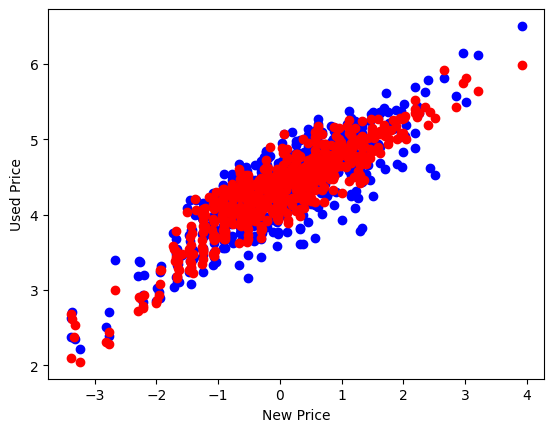

In [ ]:
plt.scatter(X_test['normalized_new_price'], y_test, color='blue')
plt.scatter(X_test['normalized_new_price'], y_predict, color='red')
plt.xlabel('New Price')
plt.ylabel('Used Price')
plt.show()

<h3>Linear Regression</h3>
<p>Experiment 2B and 2C proved to give the best outcome hence either dataset can be used for optimization of the model. In this case, Dataset C will be used.</p>

In [ ]:
# Optimizing Linear Regression
X = df_c.drop('normalized_used_price', axis=1)
y = df_c['normalized_used_price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=rs)

from sklearn.linear_model import Lasso

kf = KFold(shuffle=True, random_state=72018, n_splits=5) # Creates a KFold object with a k of 5 which will be used to perform train test split using GridSearchCV to find optimal parameters
                                                         # This is only to find the optimal parameters. Training and Test datasets will still be used to train the actual regression model
lr_opt = Lasso()

params = {
    'alpha': [0.0001, 0.001, 0.05, 0.1, 1]
}

lr_model = GridSearchCV(lr_opt, params, cv=kf) # Goes through different features and polynomial degrees using kfold cross validation to find the optimal hyperparameters

lr_model.fit(X, y) # Provides GridSearchCV with the whole dataset
lr_model.best_score_, lr_model.best_params_ # Returns the best score it can get with the whole dataset and the optimal hyperparameters

(0.8345686222887281, {'alpha': 0.0001})

In [ ]:
# Support Vector Regression
lr_model2 = Lasso(alpha=lr_model.best_params_['alpha'])

lr = lr_model2.fit(X_train, y_train) # Using the training dataset and trains the model "poly2" where the regression parameters are stored in "poly2"
y_train_predict = lr.predict(X_train) # Using the regression model to predict training data. This will be used to see if there is potential overfitting
y_predict = lr.predict(X_test) # Using the regression model to predict test data. This will be used to evaluate the model

mae = mean_absolute_error(y_train, y_train_predict) # Mean Absolute Error: Average magnitude of the errors between predicted value and real value
mse = mean_squared_error(y_train, y_train_predict) # Mean Squared Error: Average squared magnitude of the errors between predicted value and real value
rmse = np.sqrt(mse) # Root Mean Squared Error: Square root of MSE, such that it can similarly measure the average magnitude of the errors
r2 = r2_score(y_train, y_train_predict) # R^2 Score: How good the regression model fits to the data and how good can it predict to the expected outcome

train_evaluation = pd.DataFrame({'Experiment': ['Linear Regression'],
                                 'MAE': [mae],
                                 'MSE': [mse],
                                 'RMSE': [rmse],
                                 'R2Score': [r2]})

# Model against Testing data
mae = mean_absolute_error(y_test, y_predict)
mse = mean_squared_error(y_test, y_predict)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_predict)

evaluation = pd.DataFrame({'Experiment': ['Linear Regression'],
                           'MAE': [mae],
                           'MSE': [mse],
                           'RMSE': [rmse],
                           'R2Score': [r2]})

In [ ]:
train_evaluation

,Experiment,MAE,MSE,RMSE,R2Score
0,Linear Regression,0.182905,0.054821,0.234139,0.836985


In [ ]:
evaluation

,Experiment,MAE,MSE,RMSE,R2Score
0,Linear Regression,0.181945,0.053306,0.230881,0.839858


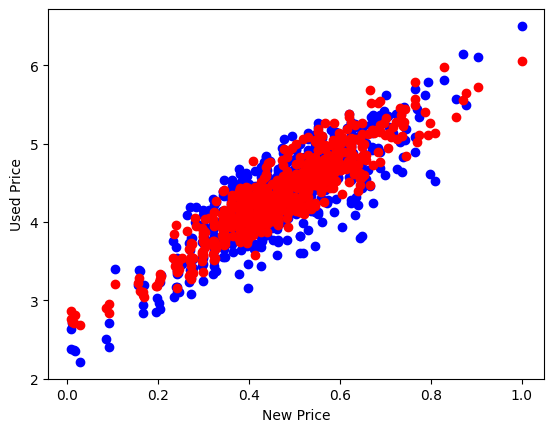

In [ ]:
plt.scatter(X_test['normalized_new_price'], y_test, color='blue')
plt.scatter(X_test['normalized_new_price'], y_predict, color='red')
plt.xlabel('New Price')
plt.ylabel('Used Price')
plt.show()

<h3>Support Vector Regression</h3>
<p>Experiment 3C proved to give the best outcome hence Dataset C will be used to optimize for the model.</p>

In [ ]:
# Optimizing Support Vector Regression
X = df_c.drop('normalized_used_price', axis=1)
y = df_c['normalized_used_price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=rs)

kf = KFold(shuffle=True, random_state=72018, n_splits=5) # Creates a KFold object with a k of 5 which will be used to perform train test split using GridSearchCV to find optimal parameters

svr_opt = SVR()

params = {
    'C': [1, 10, 100],
    'epsilon': [1, 0.1, 0.01, 0.01],
    'gamma': [1, 0.1, 0.01],
    'kernel': ['poly', 'rbf', 'sigmoid']
}

svr_model = GridSearchCV(svr_opt, params, cv=kf) # Goes through different features and polynomial degrees using kfold cross validation to find the optimal hyperparameters

svr_model.fit(X, y) # Provides GridSearchCV with the whole dataset
svr_model.best_score_, svr_model.best_params_ # Returns the best score it can get with the whole dataset and the optimal hyperparameters

(0.8505025575962353, {'C': 100, 'epsilon': 0.1, 'gamma': 0.1, 'kernel': 'rbf'})

In [ ]:
# Support Vector Regression
svr_model2 = SVR(C=svr_model.best_params_['C'],
                 epsilon=svr_model.best_params_['epsilon'],
                 gamma=svr_model.best_params_['gamma'],
                 kernel=svr_model.best_params_['kernel'])

svr = svr_model2.fit(X_train, y_train) # Using the training dataset and trains the model "poly2" where the regression parameters are stored in "poly2"
y_train_predict = svr.predict(X_train) # Using the regression model to predict training data. This will be used to see if there is potential overfitting
y_predict = svr.predict(X_test) # Using the regression model to predict test data. This will be used to evaluate the model

mae = mean_absolute_error(y_train, y_train_predict) # Mean Absolute Error: Average magnitude of the errors between predicted value and real value
mse = mean_squared_error(y_train, y_train_predict) # Mean Squared Error: Average squared magnitude of the errors between predicted value and real value
rmse = np.sqrt(mse) # Root Mean Squared Error: Square root of MSE, such that it can similarly measure the average magnitude of the errors
r2 = r2_score(y_train, y_train_predict) # R^2 Score: How good the regression model fits to the data and how good can it predict to the expected outcome

train_evaluation = pd.DataFrame({'Experiment': ['Support Vector Regression'],
                                 'MAE': [mae],
                                 'MSE': [mse],
                                 'RMSE': [rmse],
                                 'R2Score': [r2]})

# Model against Testing data
mae = mean_absolute_error(y_test, y_predict)
mse = mean_squared_error(y_test, y_predict)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_predict)

evaluation = pd.DataFrame({'Experiment': ['Support Vector Regression'],
                           'MAE': [mae],
                           'MSE': [mse],
                           'RMSE': [rmse],
                           'R2Score': [r2]})

In [ ]:
train_evaluation

,Experiment,MAE,MSE,RMSE,R2Score
0,Support Vector Regression,0.162561,0.044589,0.211161,0.867411


In [ ]:
evaluation

,Experiment,MAE,MSE,RMSE,R2Score
0,Support Vector Regression,0.170859,0.049573,0.22265,0.851073


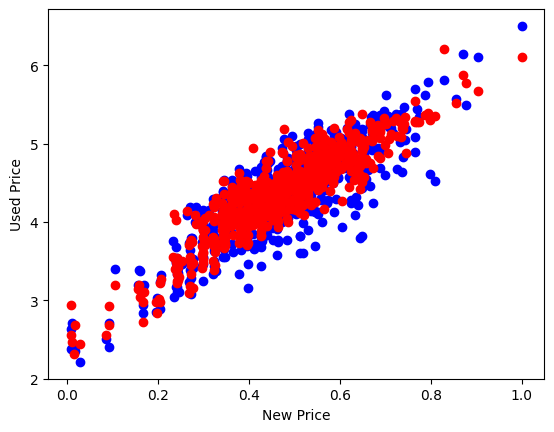

In [ ]:
plt.scatter(X_test['normalized_new_price'], y_test, color='blue')
plt.scatter(X_test['normalized_new_price'], y_predict, color='red')
plt.xlabel('New Price')
plt.ylabel('Used Price')
plt.show()